In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from tqdm import tqdm
from sklearn.decomposition import PCA
from sklearn import metrics
from math import pi

In [2]:
df = pd.read_csv("dataset/user_profiles.csv", index_col=0)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11508 entries, 2353593986 to 933183398
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   name                    11508 non-null  object 
 1   lang                    11508 non-null  object 
 2   bot                     11508 non-null  int64  
 3   created_at              11508 non-null  object 
 4   statuses_count          11508 non-null  int64  
 5   avg_length              11508 non-null  float64
 6   avg_special_chars       11508 non-null  float64
 7   urls_ratio              11508 non-null  float64
 8   mentions_ratio          11508 non-null  float64
 9   hashtags_ratio          11508 non-null  float64
 10  reply_count_mean        11508 non-null  float64
 11  reply_count_std         11508 non-null  float64
 12  reply_count_entropy     11508 non-null  float64
 13  favorite_count_mean     11508 non-null  float64
 14  favorite_count_std      1

In [4]:
# remove categorical features
cat_features = ["name", "lang", "bot", "created_at"]
df_cat = df[cat_features]
df_num = df.loc[:, ~df.columns.isin(cat_features)]

In [5]:
df_cat.head()

,name,lang,bot,created_at
2353593986,Lamonica Raborn,en,1,2019-02-22 18:00:42
2358850842,Lourie Botton,en,0,2019-02-26 03:02:32
137959629,Dadan Syarifudin,en,1,2015-04-30 07:09:56
466124818,Carletto Focia,it,1,2017-01-18 02:49:18
2571493866,MBK Ebook,en,0,2019-06-18 19:30:21


In [6]:
df_num.head()

,statuses_count,avg_length,avg_special_chars,urls_ratio,mentions_ratio,hashtags_ratio,reply_count_mean,reply_count_std,reply_count_entropy,favorite_count_mean,favorite_count_std,favorite_count_entropy,retweet_count_mean,retweet_count_std,retweet_count_entropy
2353593986,76,62.340909,14.015152,0.0,0.272727,0.0,0.0,0.0,0.0,0.037879,0.190903,1.609438,0.037879,0.190903,1.609438
2358850842,4,69.082645,15.041322,0.0,0.338843,0.0,0.0,0.0,0.0,0.049587,0.217090,1.791759,0.024793,0.155495,1.098612
137959629,7,19.250000,5.250000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
466124818,50,86.944871,18.689463,0.0,0.004885,0.0,0.0,0.0,0.0,0.130495,0.336848,5.231109,0.150035,1.326298,3.554720
2571493866,8,72.311246,14.582073,0.0,0.448996,0.0,0.0,0.0,0.0,0.053341,0.224712,5.267858,0.016772,0.142619,3.965939


### Functions to describe clusters

In [7]:
def plot_parallel_coordinates_clusters(df, cluster_centers):
    plt.figure(figsize=(8, 4))
    for i in range(0, len(cluster_centers)):
        plt.plot(cluster_centers[i], marker='o', label='Cluster %s' % i)
    plt.tick_params(axis='both', which='major', labelsize=10)
    plt.xticks(range(0, len(df.columns)), df.columns, fontsize=18)
    plt.legend(fontsize=10)
    plt.show()

In [41]:
def plot_radar_clusters(df, cluster_centers):
    # number of variable
    N = len(df.columns)
    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    for i in range(0, len(cluster_centers)):
        angles = [n / float(N) * 2 * pi for n in range(N)]
        values = cluster_centers[i].tolist()
        values += values[:1]
        angles += angles[:1]
        # Initialise the spider plot
        ax = plt.subplot(polar=True)
        # Draw one axe per variable + add labels labels yet
        plt.xticks(angles[:-1], df.columns, color='grey', size=8) 
        # Plot data
        ax.plot(angles, values, linewidth=1, linestyle='solid')
        # Fill area
        ax.fill(angles, values, 'b', alpha=0.1)

In [9]:
def plot_date_feature_clusters(df, labels, num_cluster):

    for i in range(num_cluster):
        i_samples = labels==i
        df_cat[i_samples].name.groupby(pd.to_datetime(df_cat.loc[i_samples, 'created_at'], format='%Y-%m-%d %H:%M:%S', errors='raise').dt.year).count().plot(kind="bar")
        plt.show()

In [10]:
def categorical_hist_clusters(df, labels, feature_name):
    bot_xt_pct = pd.crosstab(labels, df[feature_name])
    bot_xt_pct.plot(kind='bar', stacked=False, 
                       title=f'{feature_name} per cluster')
    plt.xlabel('Cluster')
    plt.ylabel(feature_name)
    plt.show()

In [11]:
def plot_numerical_features_clusters(df, labels, num_cluster):
    """
    print and plot distribution of numerical features conditioned by the cluster
    """
    
    for i in range(num_cluster):
        i_samples = labels==i
        df[i_samples].boxplot()
        df[i_samples].hist()
        plt.show()

In [12]:
def scatter_features_clusters(df, labels):
    for i in range(len(df.columns)):
        for j in range(i+1, len(df.columns)):
            feature_1 = df.columns[i]
            feature_2 = df.columns[j]
            
            print(f"{feature_1} - {feature_2}")
            plt.scatter(df[feature_1], df[feature_2], c=labels, s=20)
            plt.tick_params(axis='both', which='major', labelsize=22)
            plt.show()

## Preprocessing

In [13]:
scaler = StandardScaler()

In [14]:
X = scaler.fit_transform(df_num.values)

## Kmeans

In [53]:
sse_list = list()
separations = list()
max_k = 20
for k in tqdm(range(2, max_k + 1)):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100)
    kmeans.fit(X)
    
    sse = kmeans.inertia_
    sse_list.append(sse)
    separations.append(metrics.davies_bouldin_score(X, kmeans.labels_))

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:02<00:00,  6.67it/s]


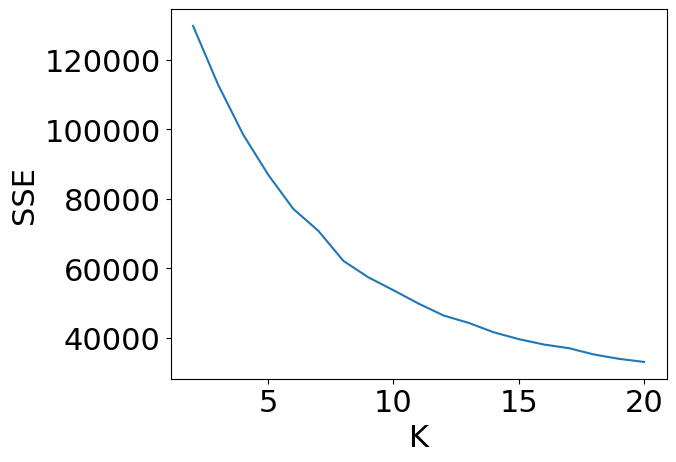

In [54]:
plt.plot(range(2, len(sse_list) + 2), sse_list)
plt.ylabel('SSE', fontsize=22)
plt.xlabel('K', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

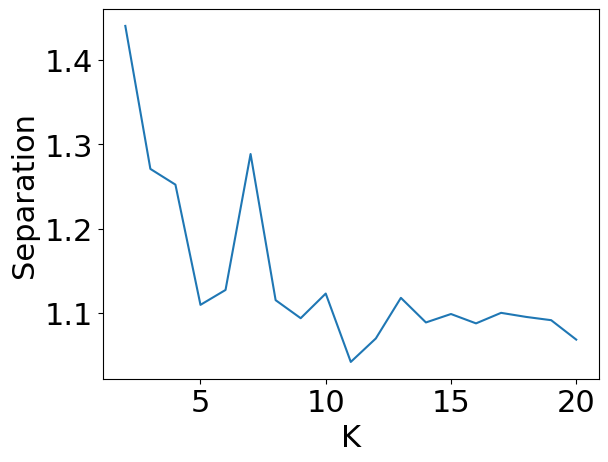

In [55]:
plt.plot(range(2, len(separations) + 2), separations)
plt.ylabel('Separation', fontsize=22)
plt.xlabel('K', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

In [17]:
selected_k = 15

In [18]:
kmeans = KMeans(n_clusters=selected_k, n_init=100, max_iter=500)
kmeans.fit(X)

KMeans(max_iter=500, n_clusters=15, n_init=100)

### Plot Cluster Results

In [19]:
centers = scaler.inverse_transform(kmeans.cluster_centers_)

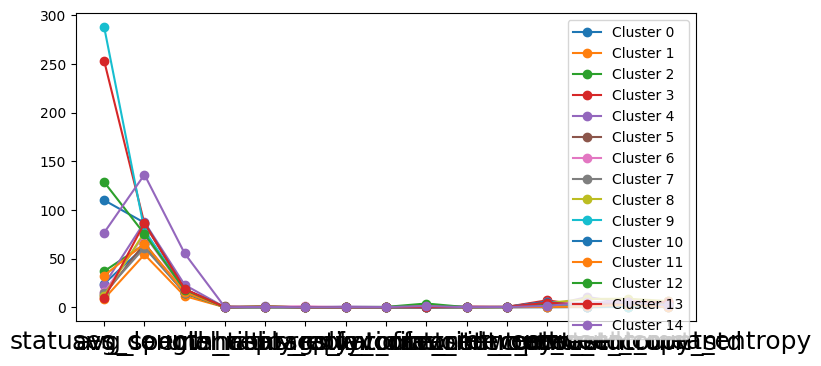

In [20]:
plot_parallel_coordinates_clusters(df_num, centers)

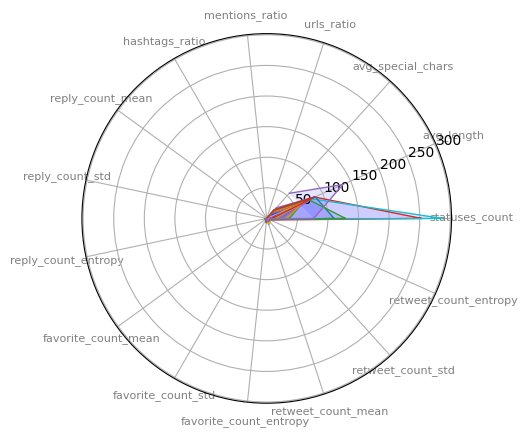

In [21]:
plot_radar_clusters(df_num, centers)

#### Distribution of CategoricalFeatures per Cluster

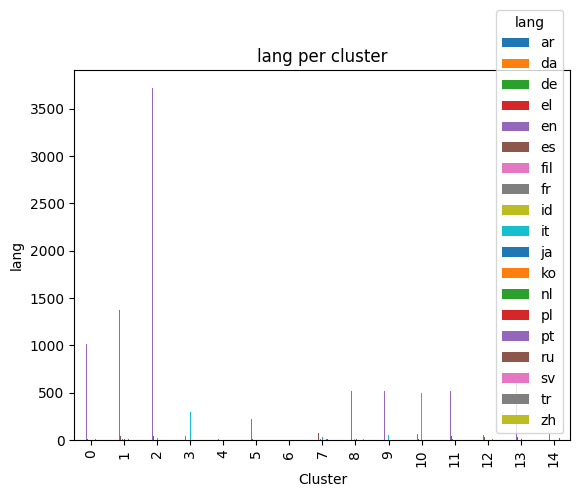

In [22]:
categorical_hist_clusters(df_cat, kmeans.labels_, "lang")

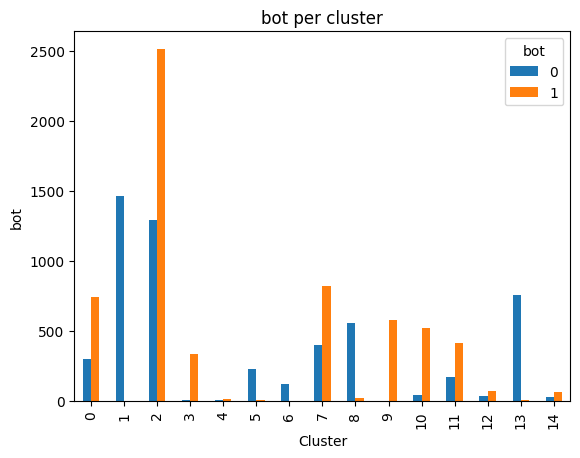

In [23]:
categorical_hist_clusters(df_cat, kmeans.labels_, "bot")

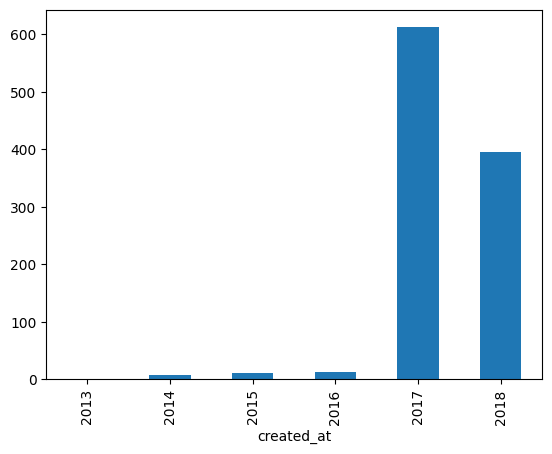

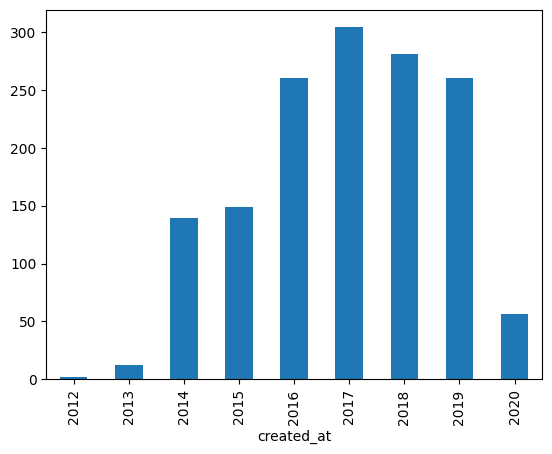

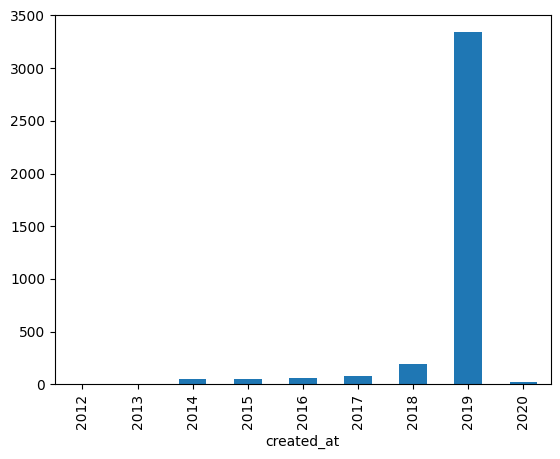

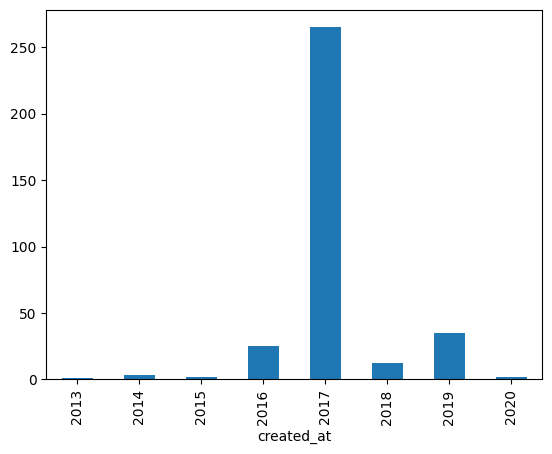

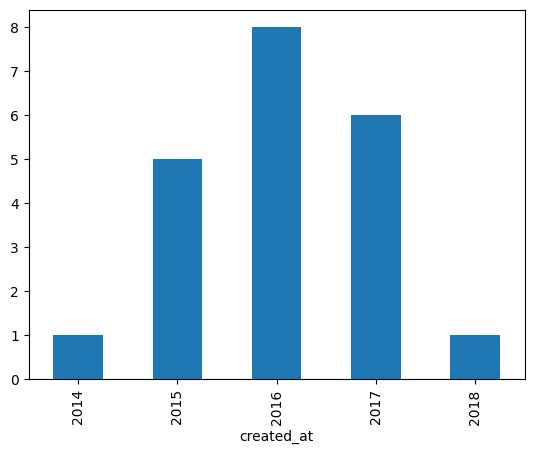

...

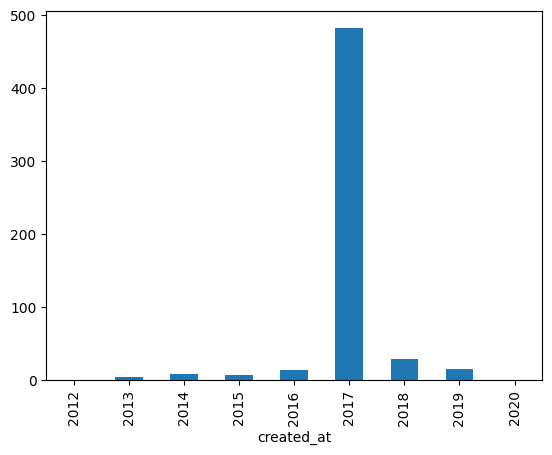

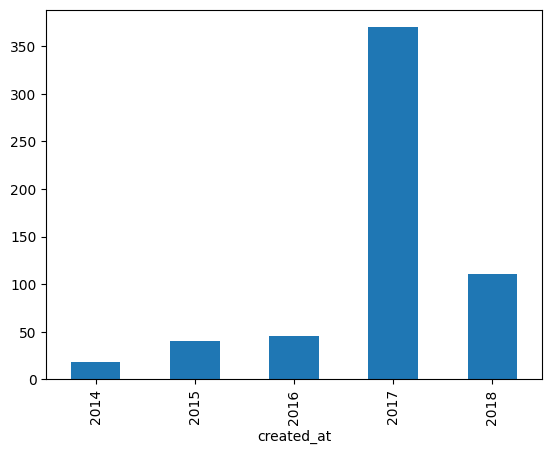

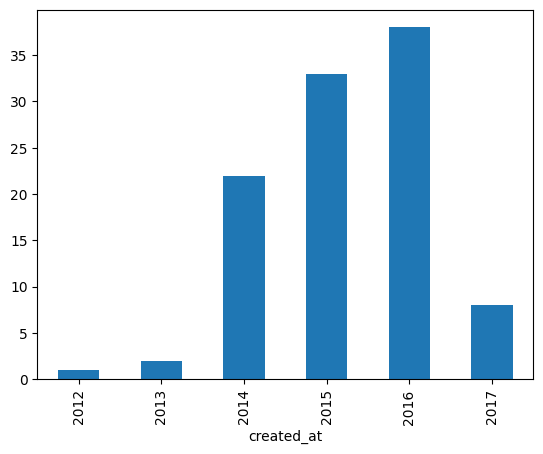

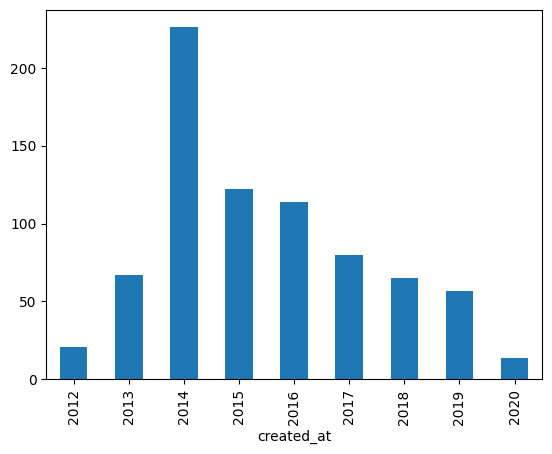

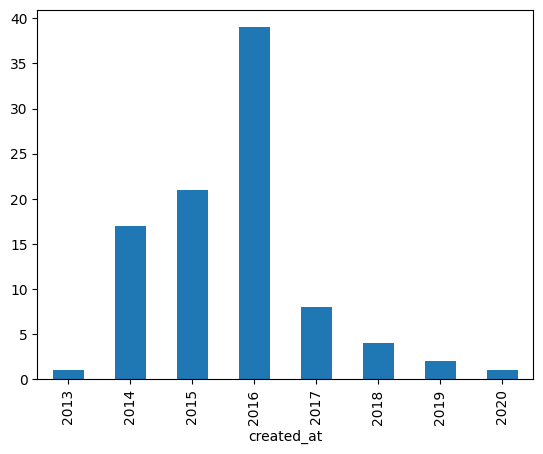

In [24]:
plot_date_feature_clusters(df, kmeans.labels_, selected_k)

#### Distribution of Numerical Features per Cluster

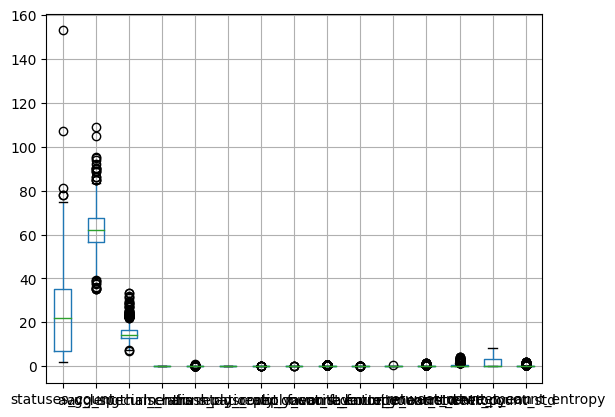

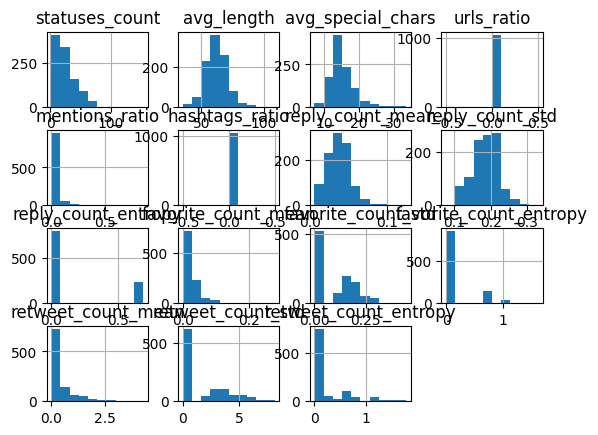

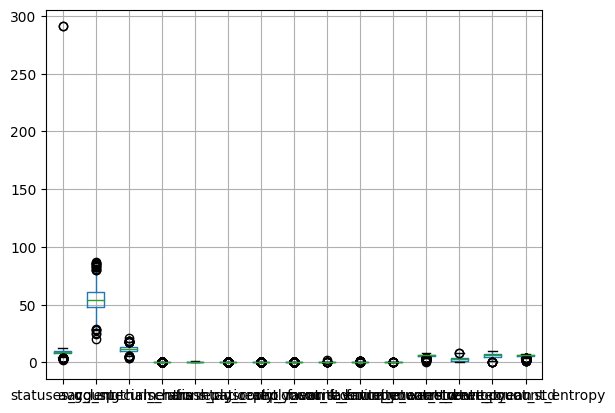

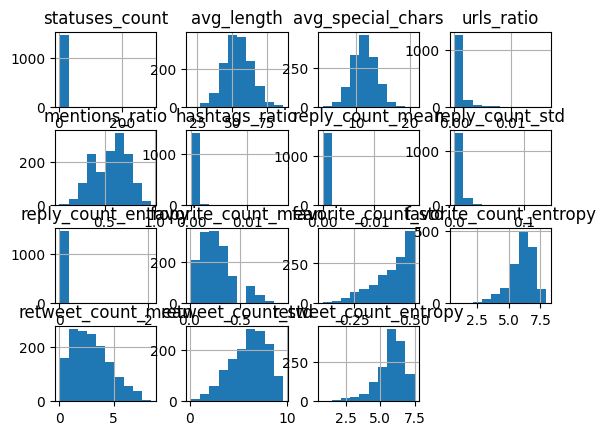

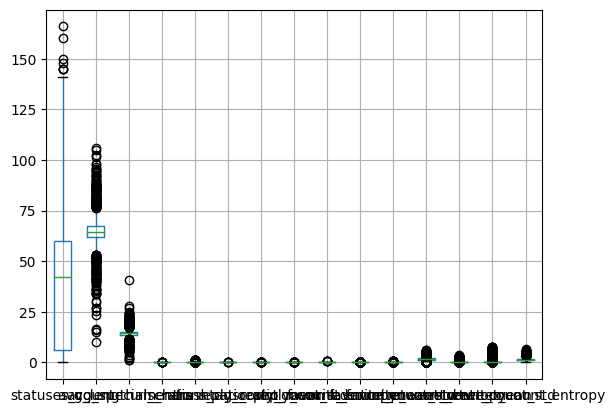

...

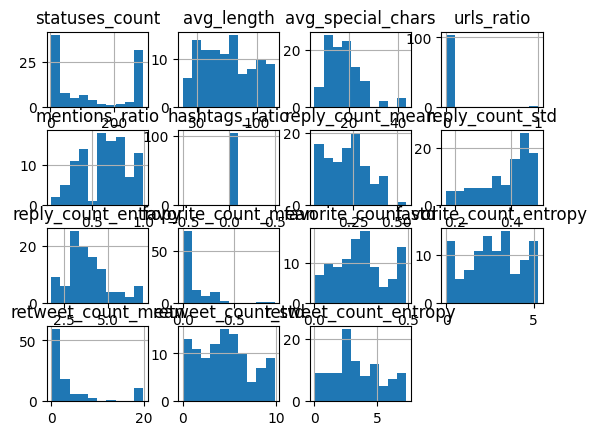

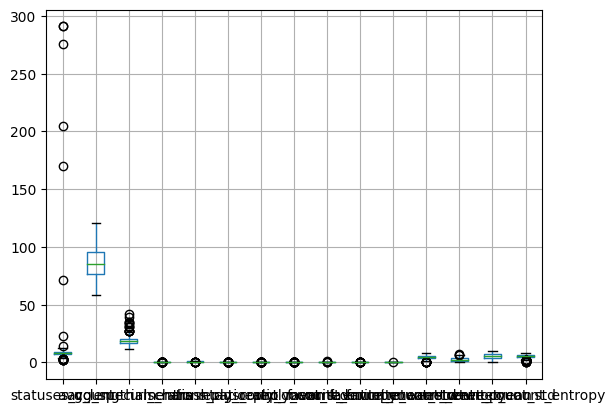

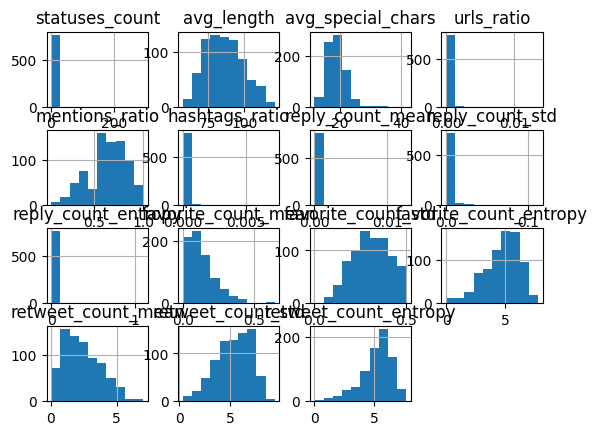

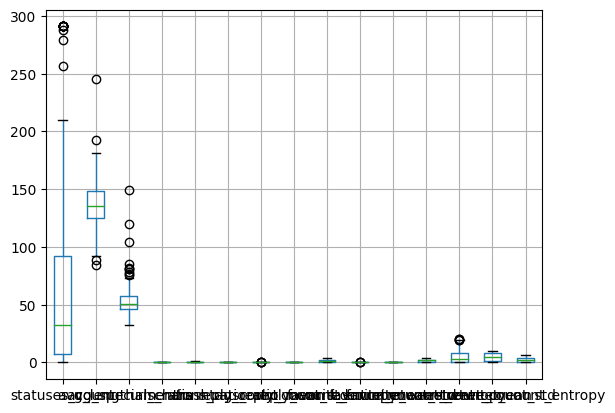

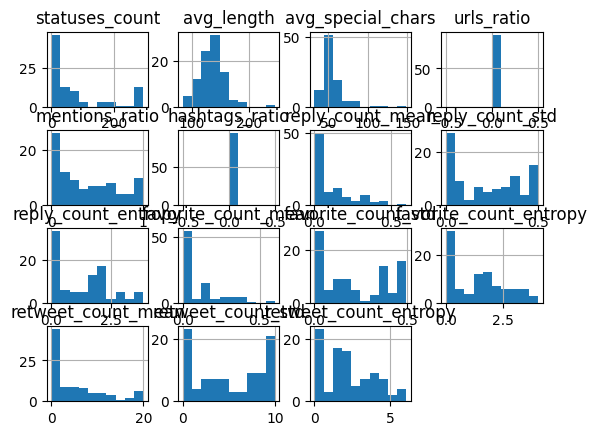

In [25]:
plot_numerical_features_clusters(df_num, kmeans.labels_, selected_k)

statuses_count - avg_length


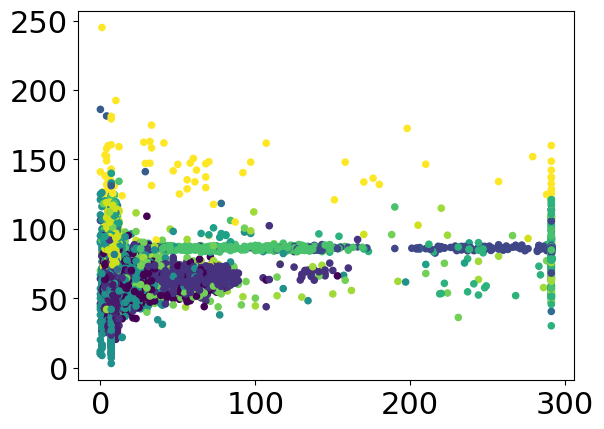

statuses_count - avg_special_chars


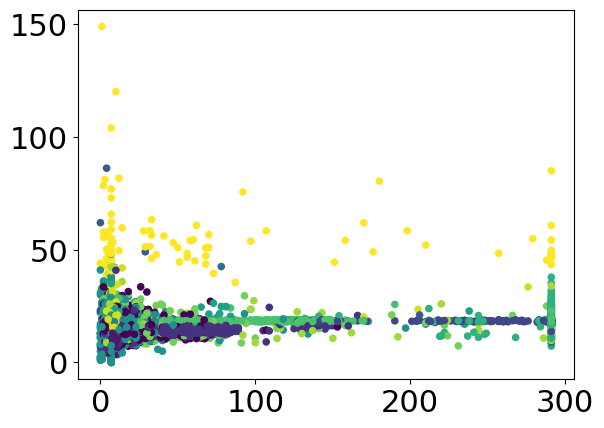

statuses_count - urls_ratio


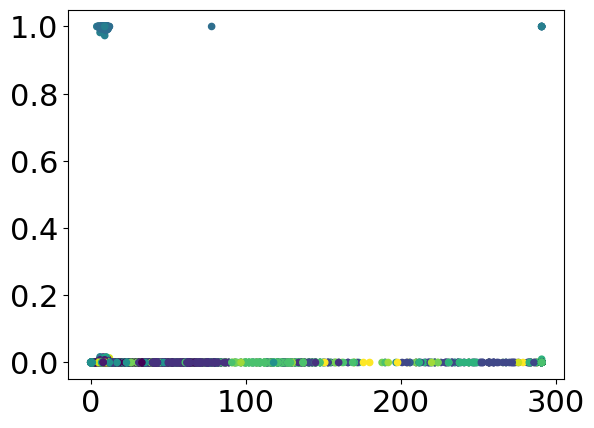

statuses_count - mentions_ratio


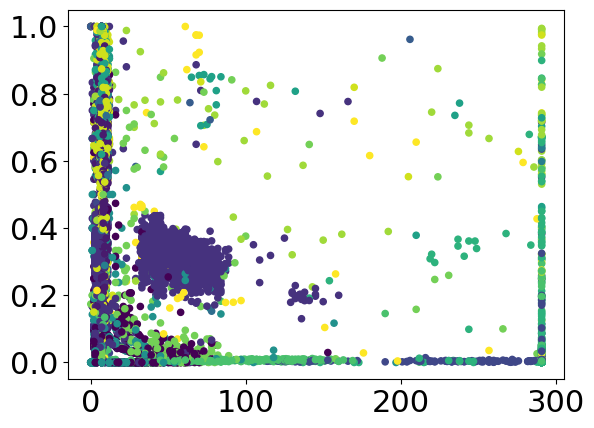

statuses_count - hashtags_ratio


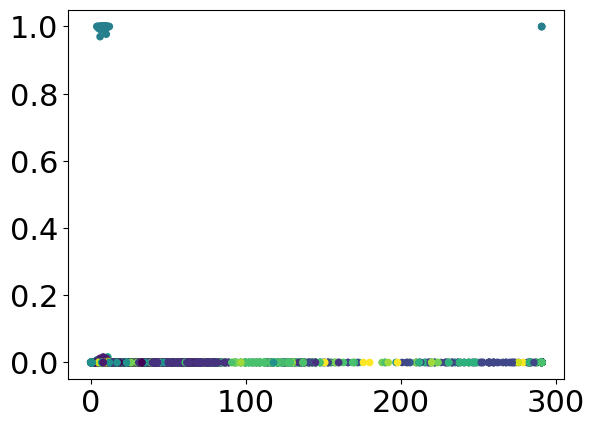

statuses_count - reply_count_mean


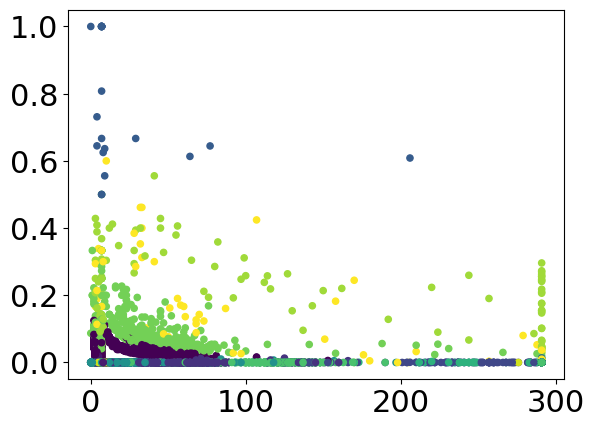

statuses_count - reply_count_std


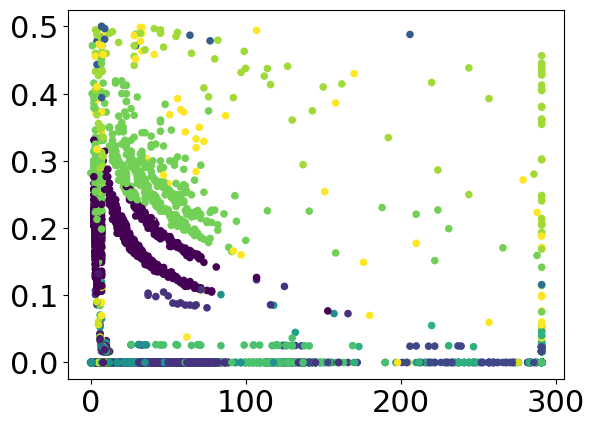

statuses_count - reply_count_entropy


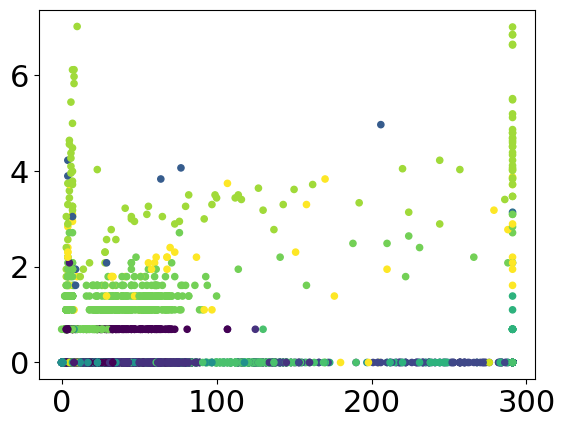

statuses_count - favorite_count_mean


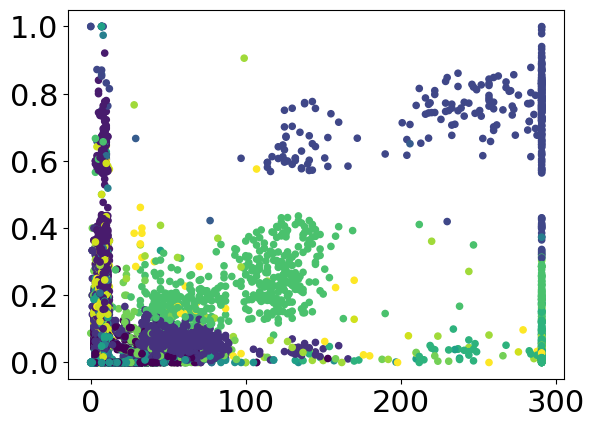

statuses_count - favorite_count_std


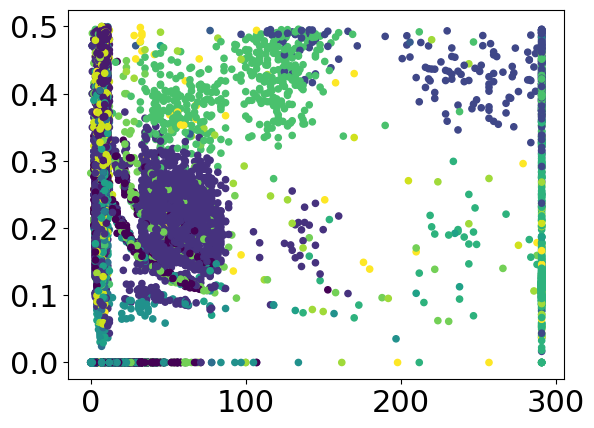

statuses_count - favorite_count_entropy


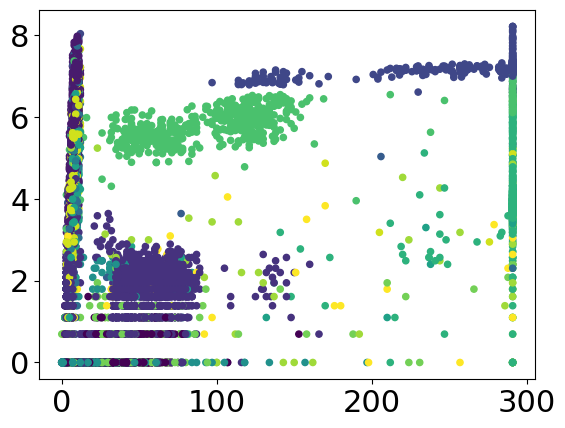

statuses_count - retweet_count_mean


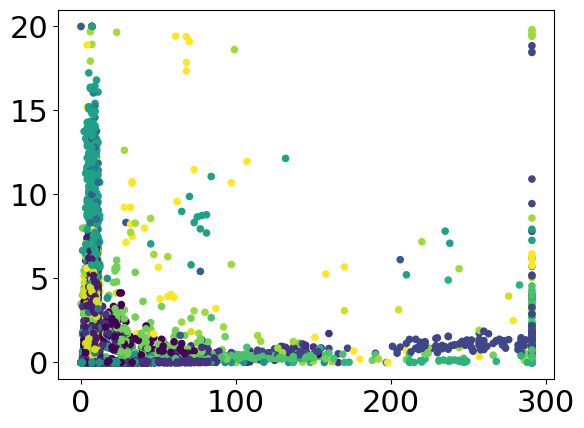

statuses_count - retweet_count_std


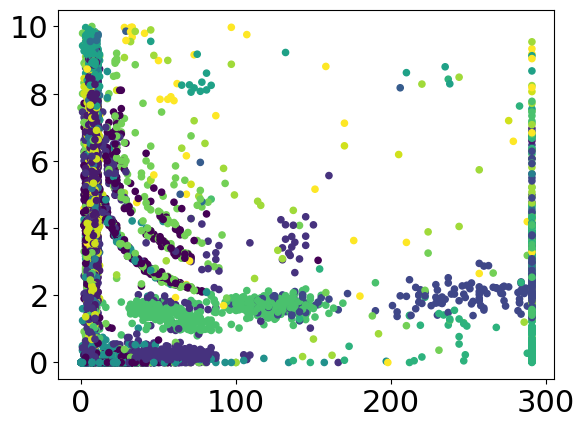

statuses_count - retweet_count_entropy


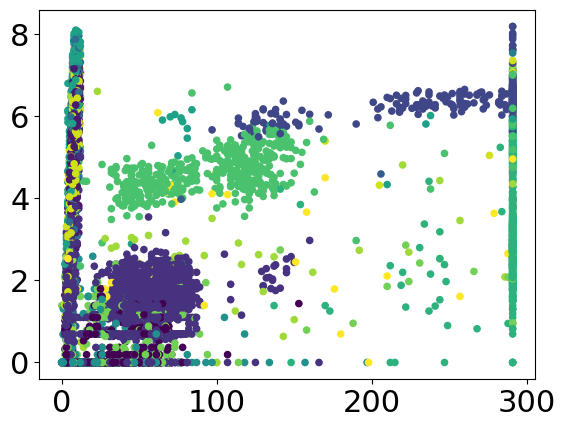

avg_length - avg_special_chars


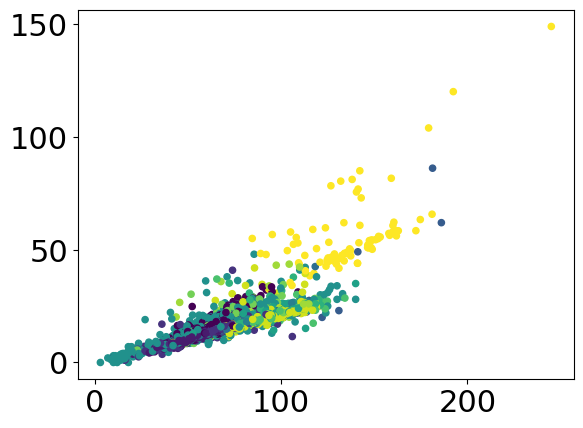

avg_length - urls_ratio


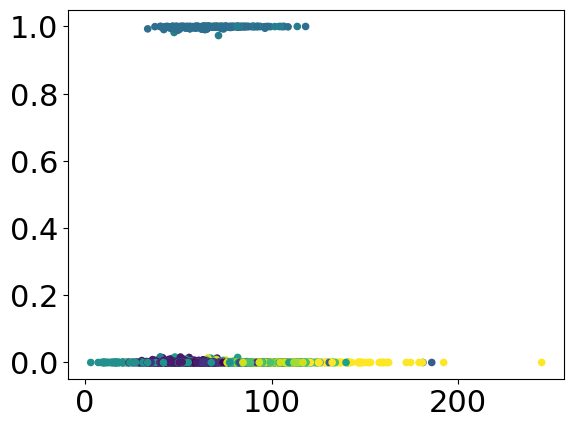

avg_length - mentions_ratio


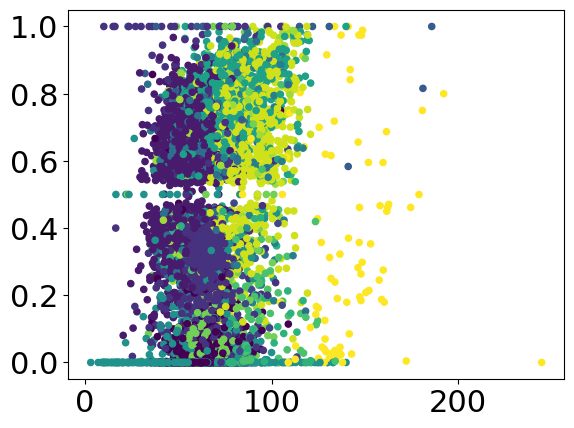

avg_length - hashtags_ratio


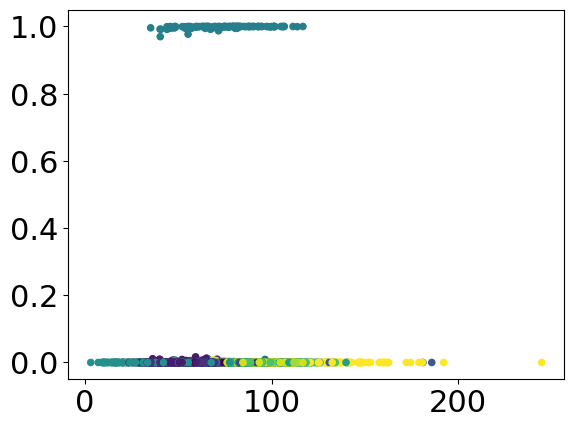

avg_length - reply_count_mean


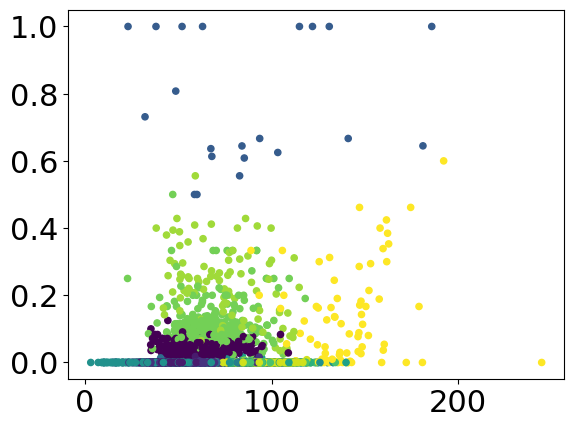

avg_length - reply_count_std


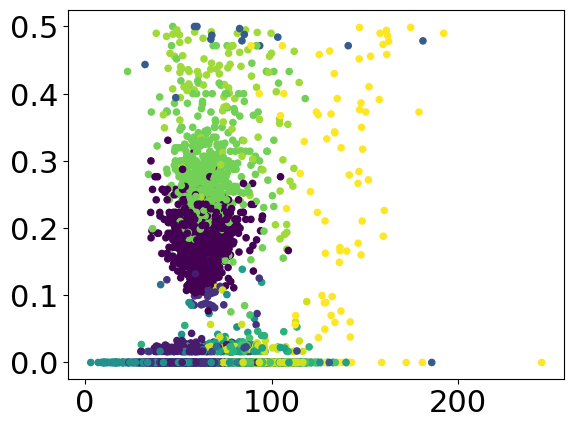

avg_length - reply_count_entropy


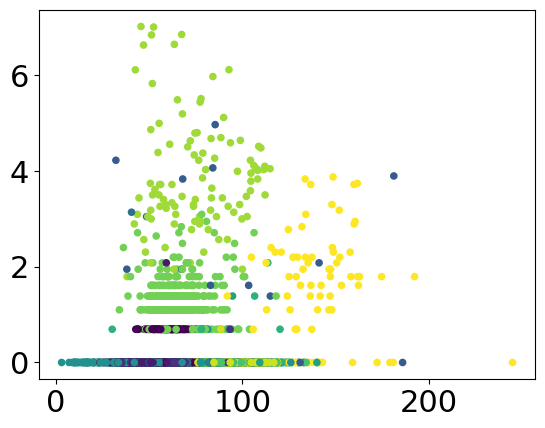

avg_length - favorite_count_mean


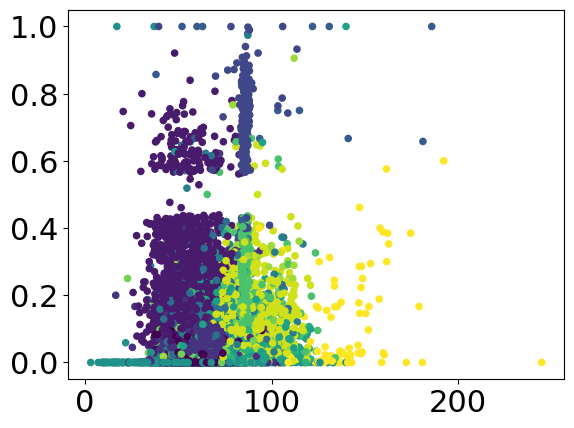

avg_length - favorite_count_std


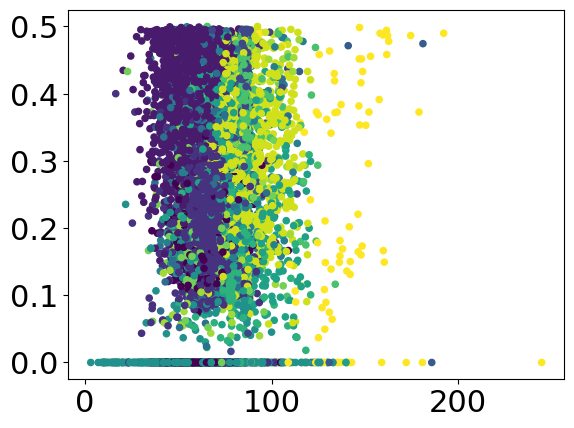

avg_length - favorite_count_entropy


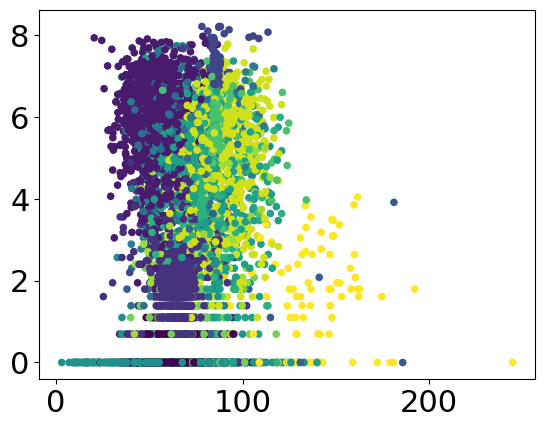

avg_length - retweet_count_mean


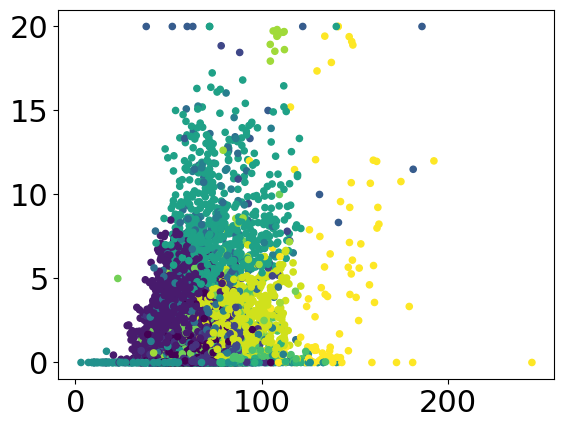

avg_length - retweet_count_std


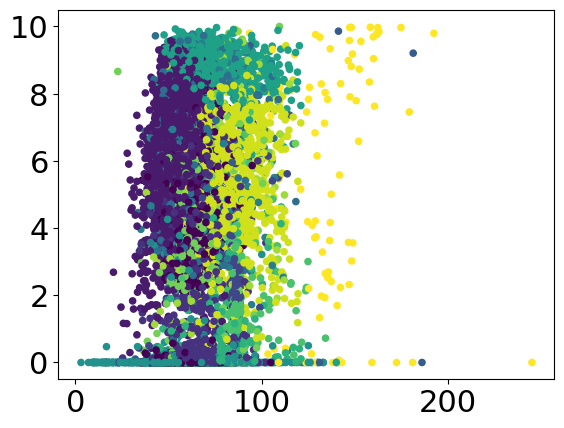

avg_length - retweet_count_entropy


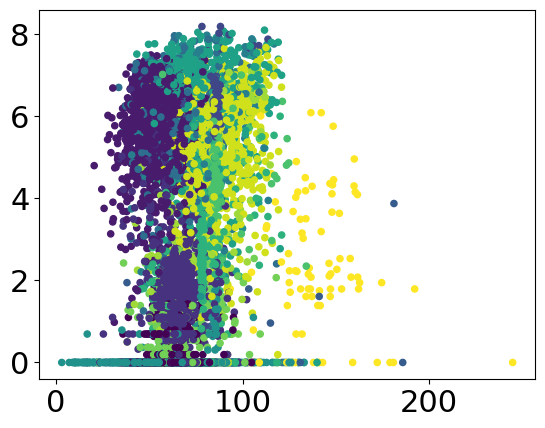

avg_special_chars - urls_ratio


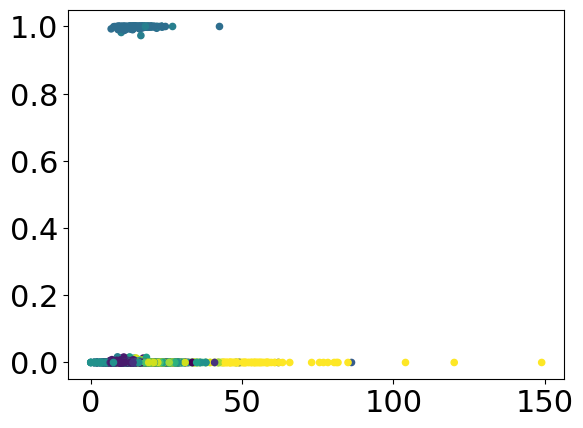

avg_special_chars - mentions_ratio


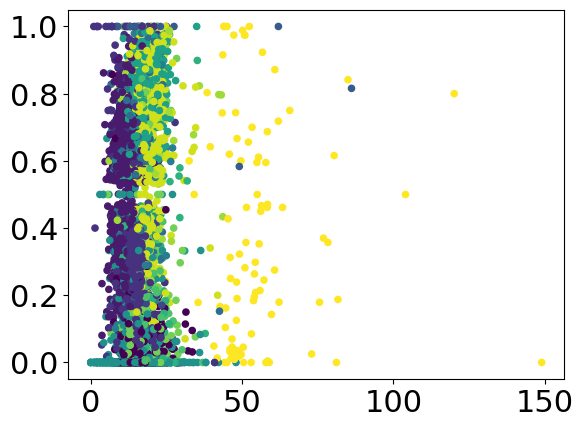

avg_special_chars - hashtags_ratio


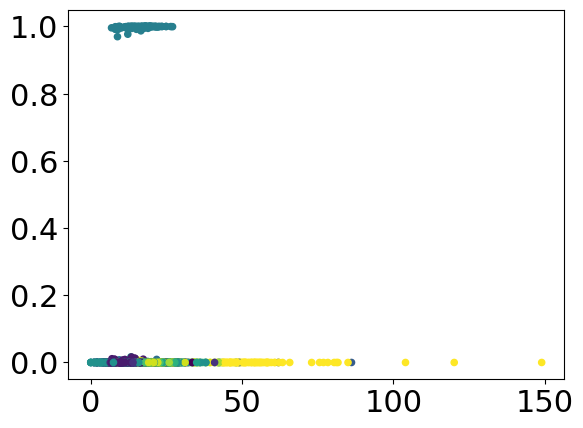

avg_special_chars - reply_count_mean


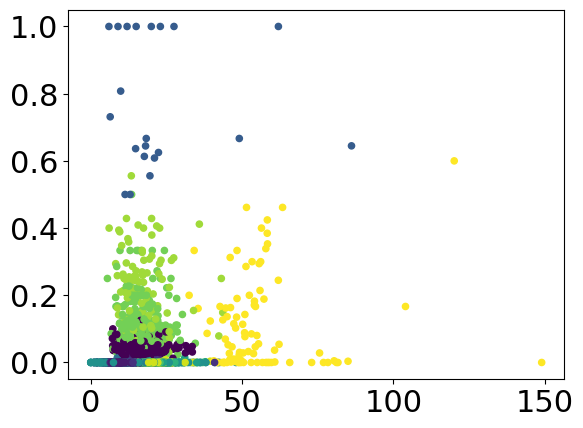

avg_special_chars - reply_count_std


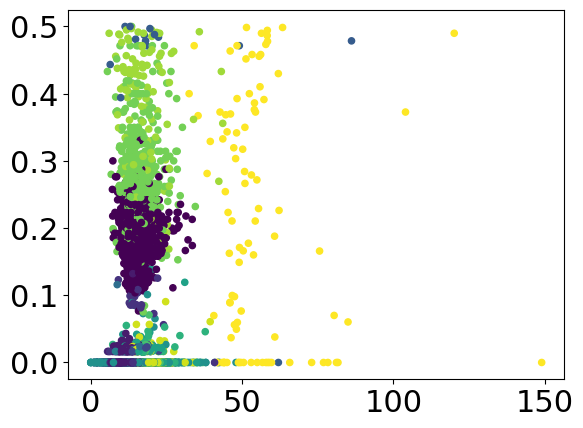

avg_special_chars - reply_count_entropy


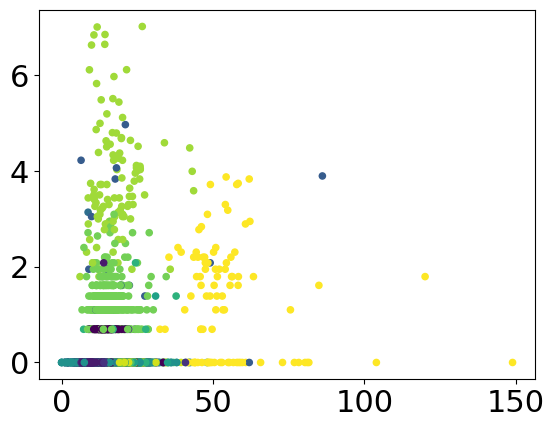

avg_special_chars - favorite_count_mean


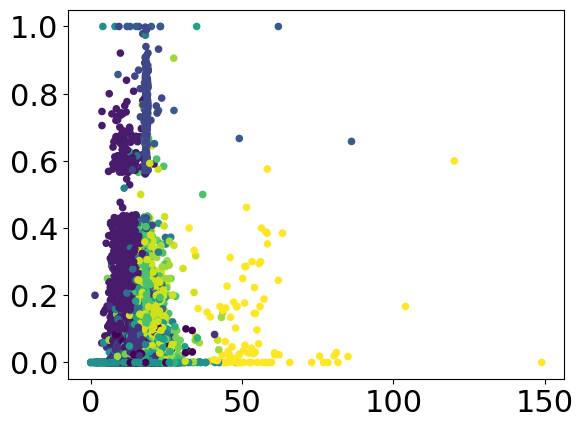

avg_special_chars - favorite_count_std


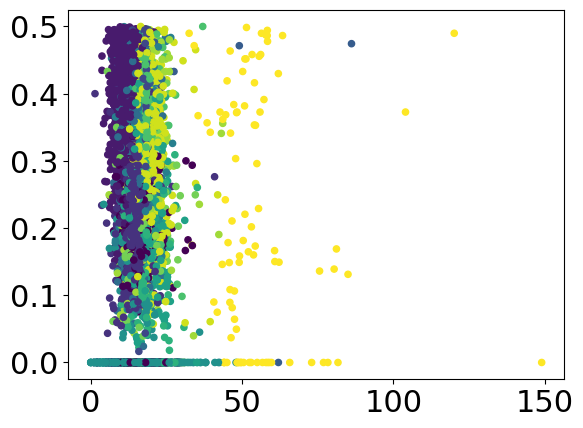

avg_special_chars - favorite_count_entropy


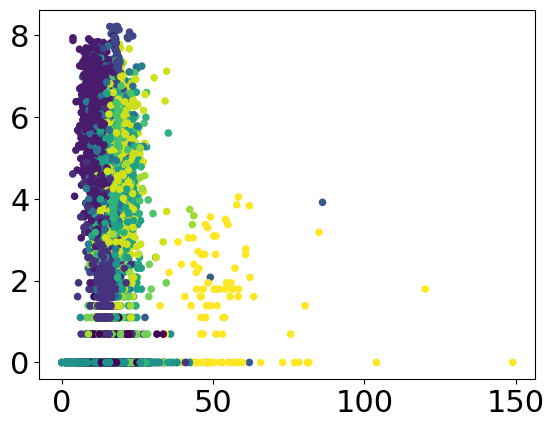

avg_special_chars - retweet_count_mean


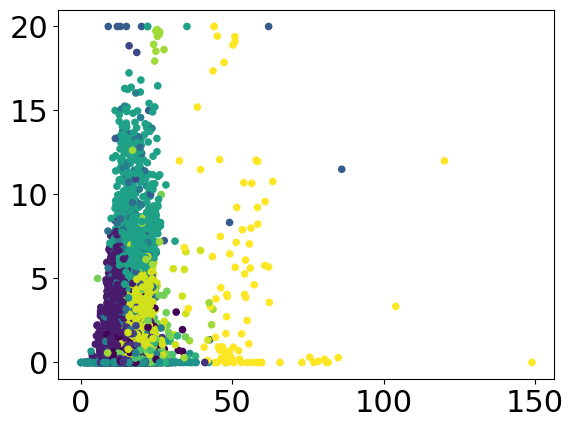

avg_special_chars - retweet_count_std


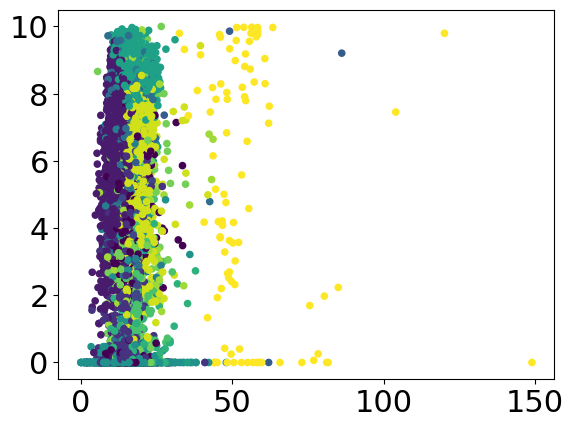

avg_special_chars - retweet_count_entropy


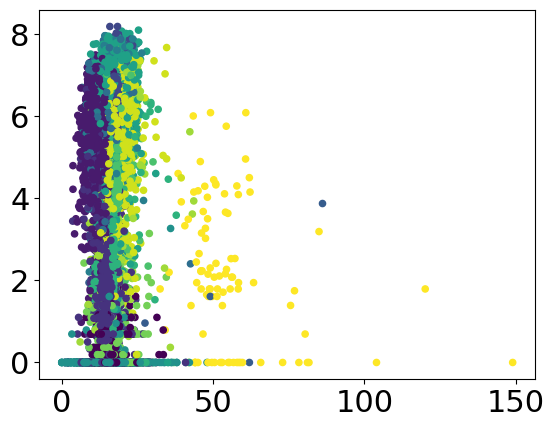

urls_ratio - mentions_ratio


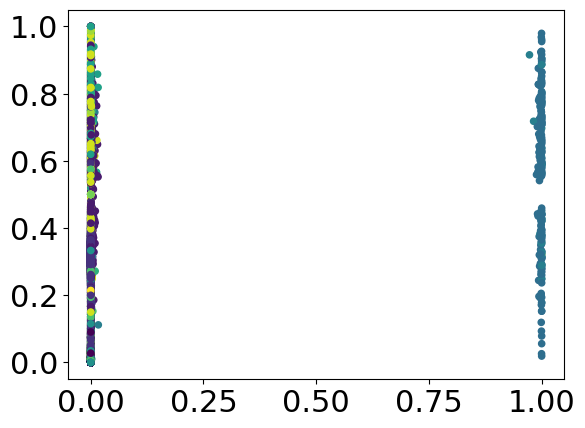

urls_ratio - hashtags_ratio


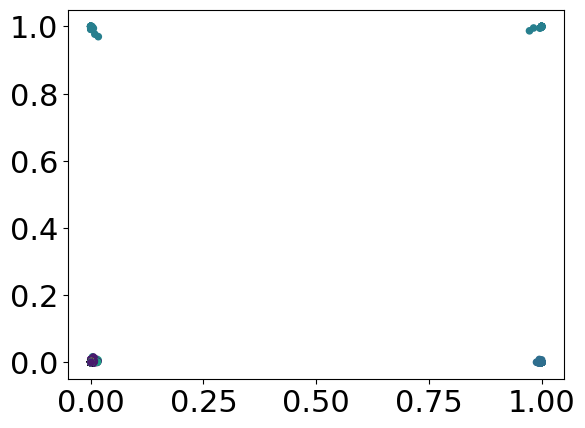

urls_ratio - reply_count_mean


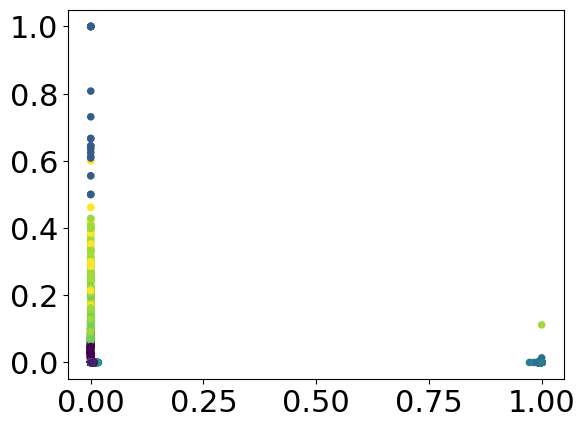

urls_ratio - reply_count_std


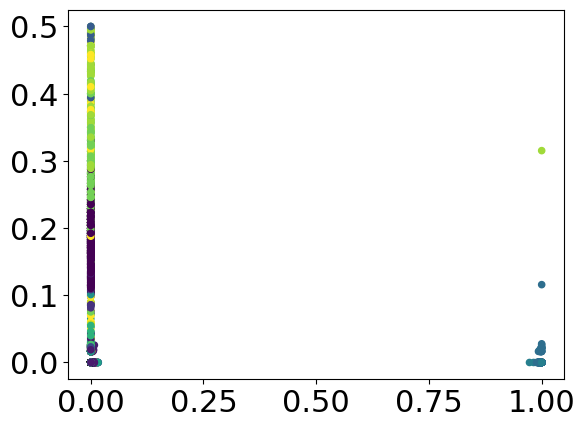

urls_ratio - reply_count_entropy


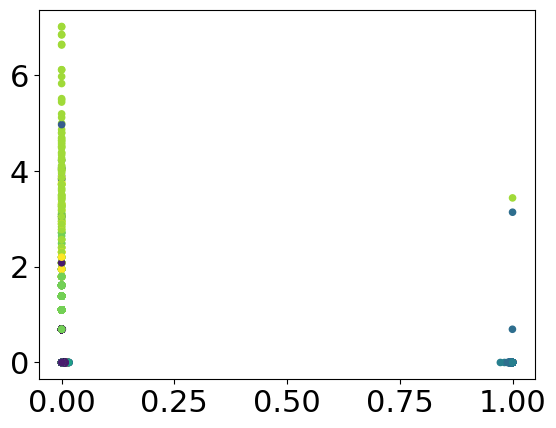

urls_ratio - favorite_count_mean


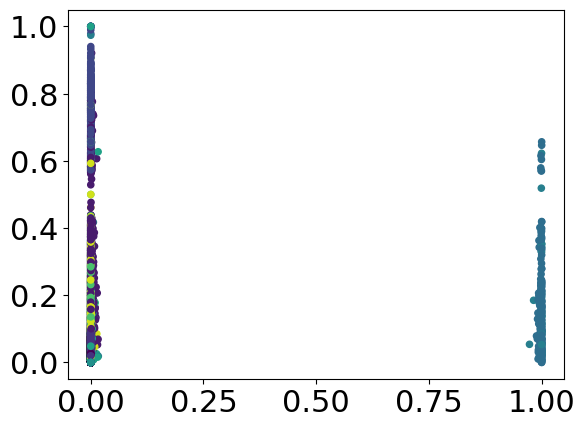

urls_ratio - favorite_count_std


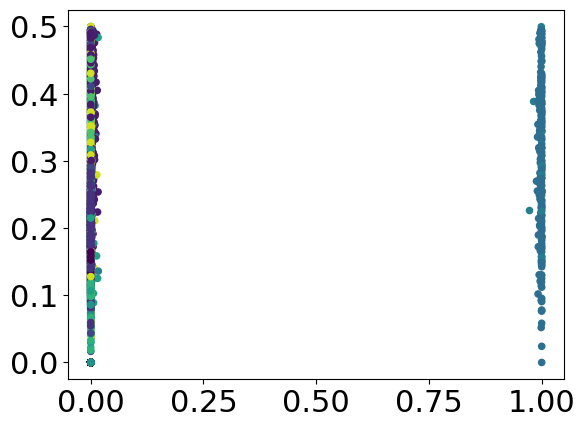

urls_ratio - favorite_count_entropy


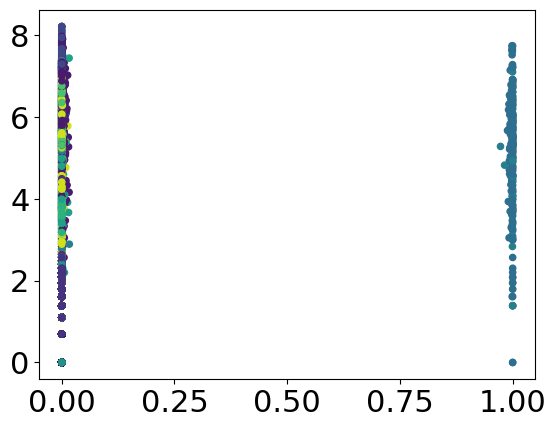

urls_ratio - retweet_count_mean


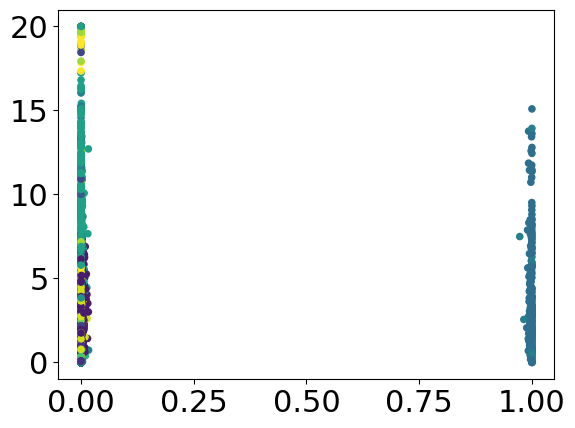

urls_ratio - retweet_count_std


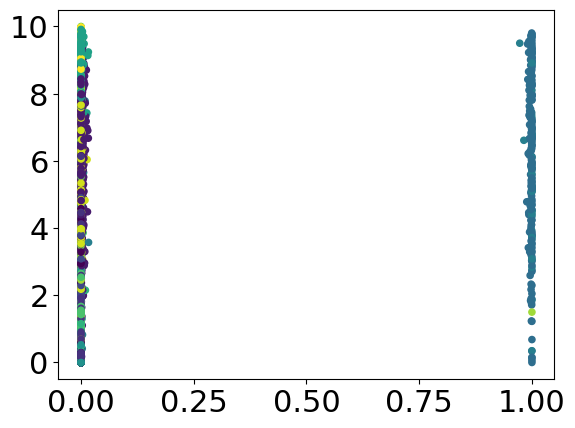

urls_ratio - retweet_count_entropy


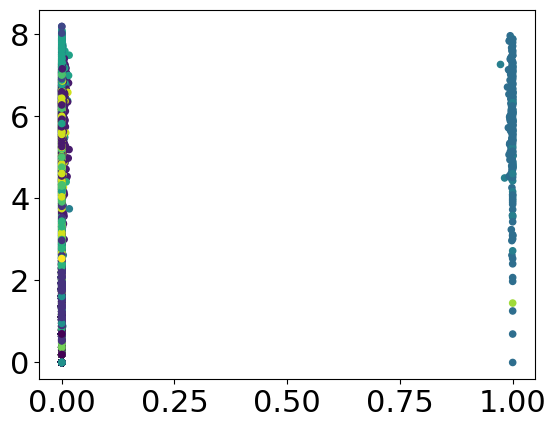

mentions_ratio - hashtags_ratio


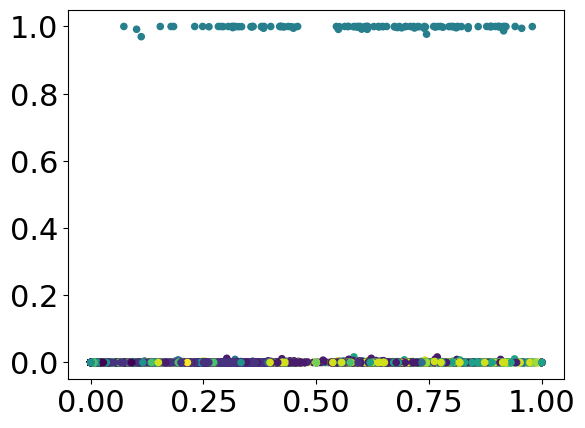

mentions_ratio - reply_count_mean


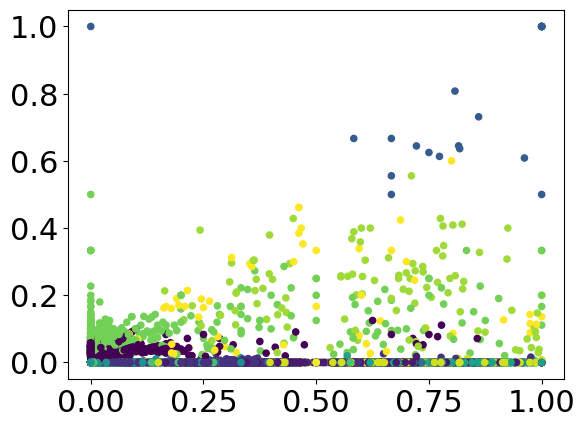

mentions_ratio - reply_count_std


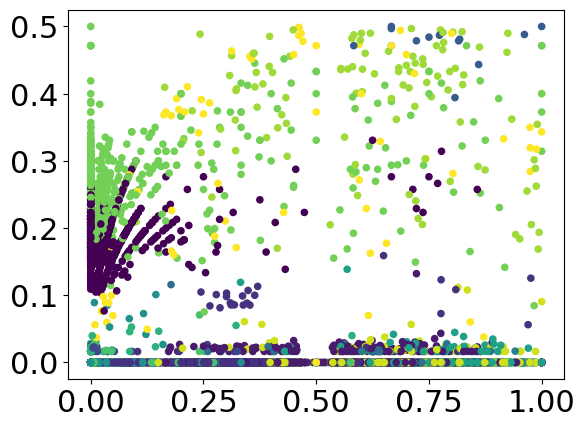

mentions_ratio - reply_count_entropy


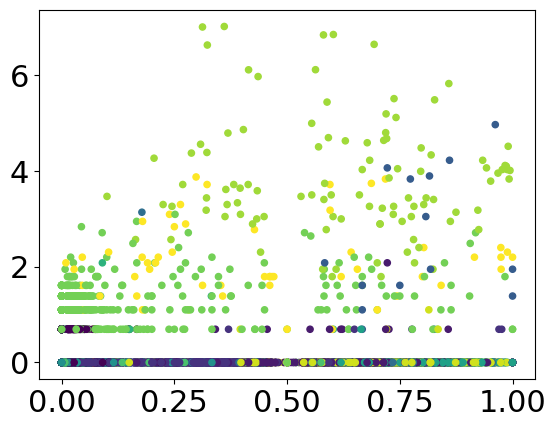

mentions_ratio - favorite_count_mean


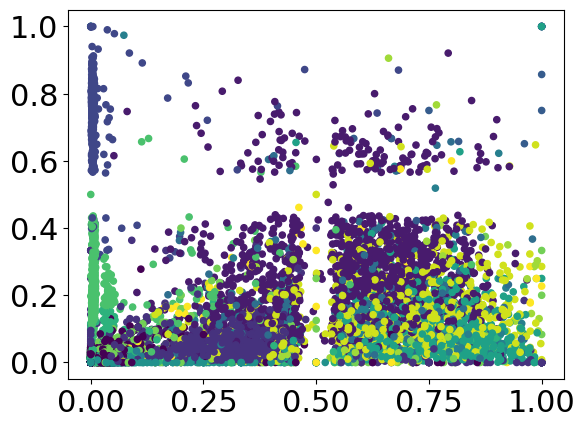

mentions_ratio - favorite_count_std


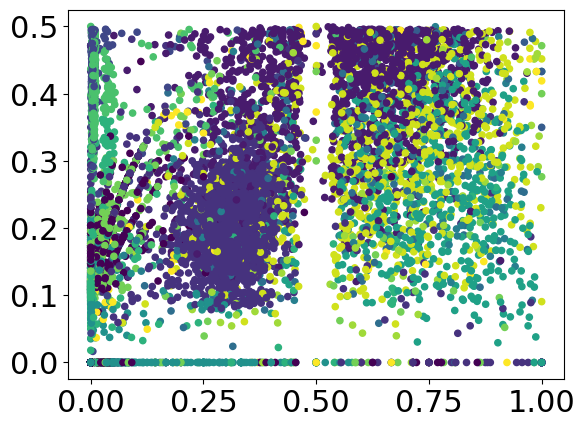

mentions_ratio - favorite_count_entropy


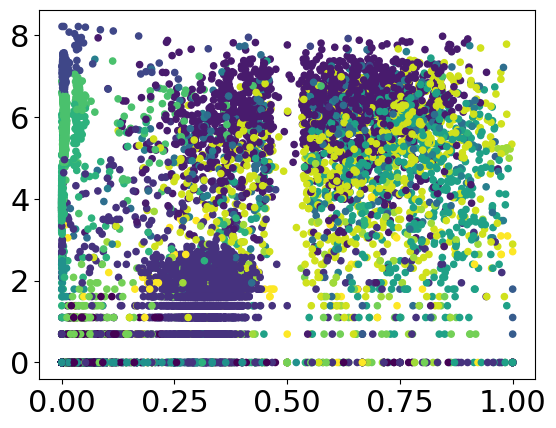

mentions_ratio - retweet_count_mean


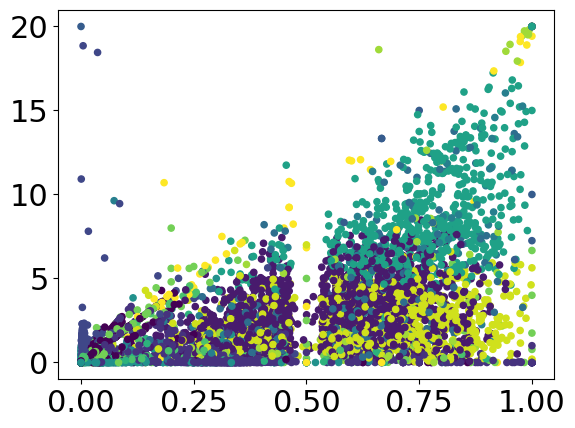

mentions_ratio - retweet_count_std


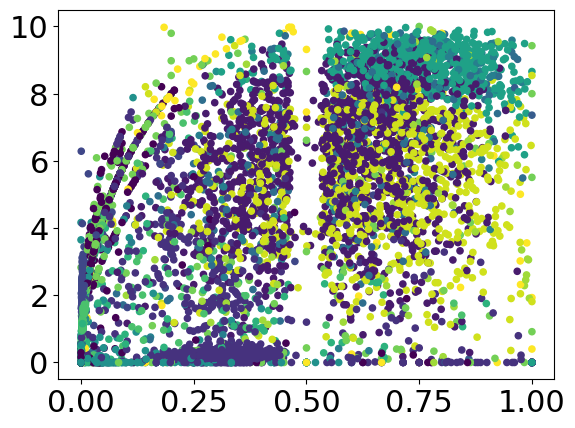

mentions_ratio - retweet_count_entropy


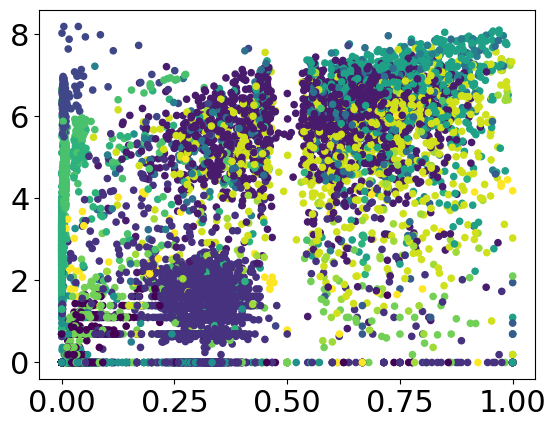

hashtags_ratio - reply_count_mean


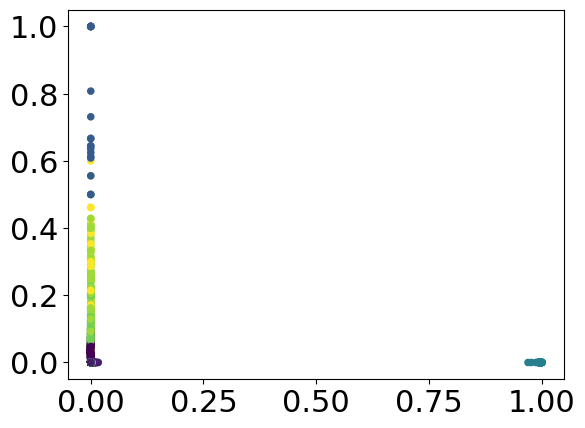

hashtags_ratio - reply_count_std


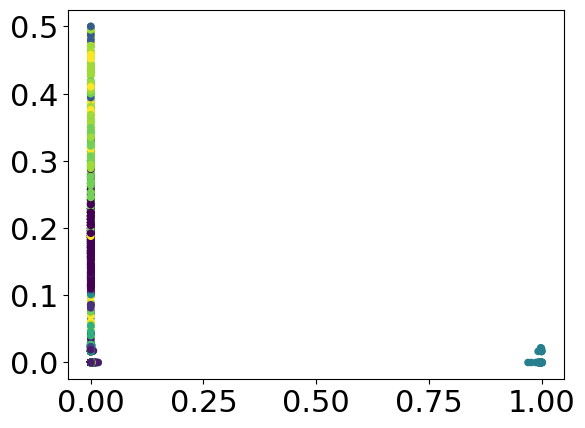

hashtags_ratio - reply_count_entropy


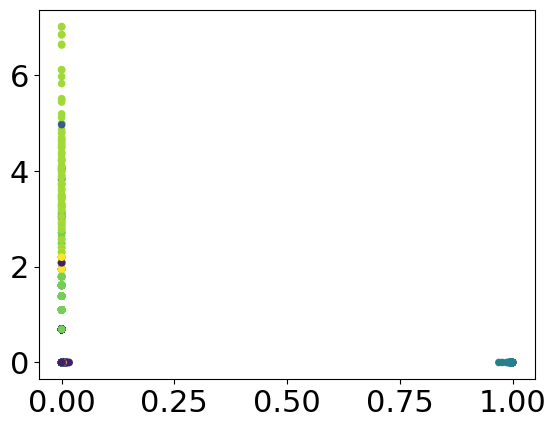

hashtags_ratio - favorite_count_mean


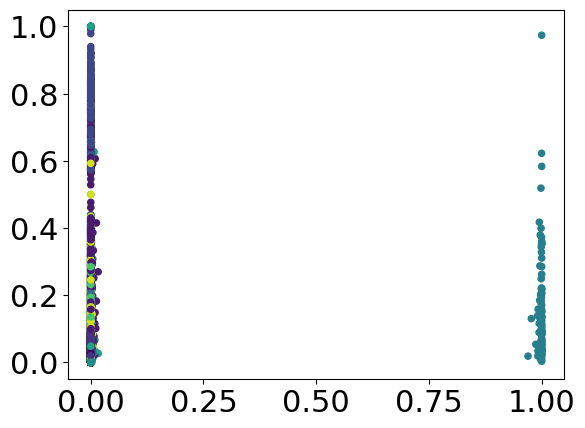

hashtags_ratio - favorite_count_std


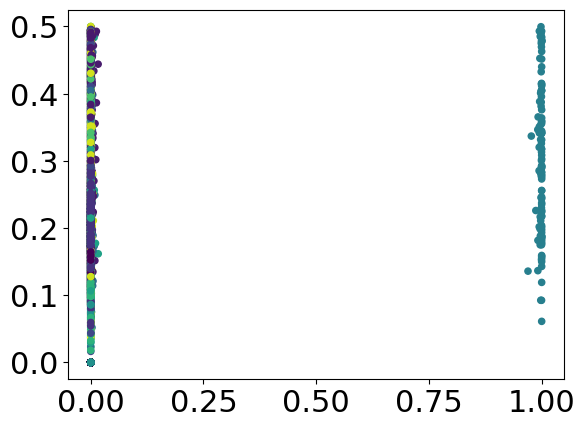

hashtags_ratio - favorite_count_entropy


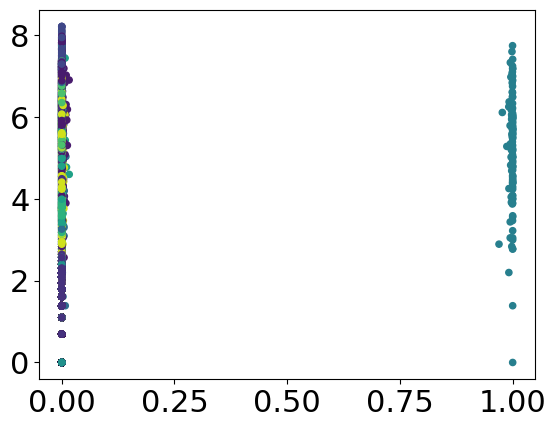

hashtags_ratio - retweet_count_mean


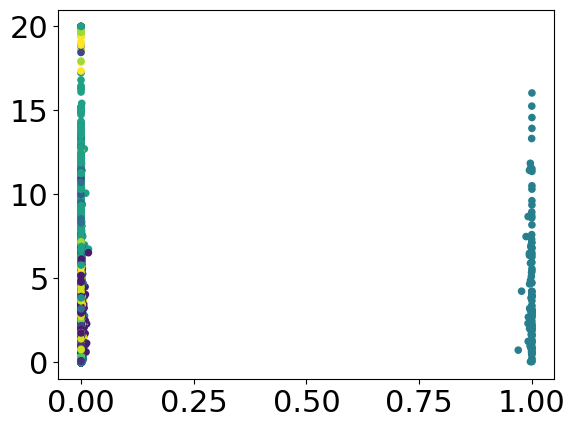

hashtags_ratio - retweet_count_std


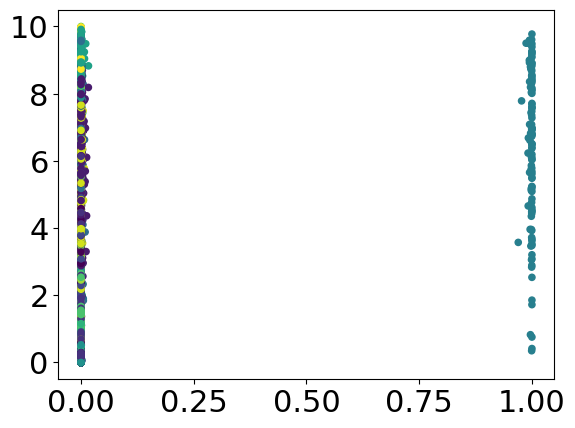

hashtags_ratio - retweet_count_entropy


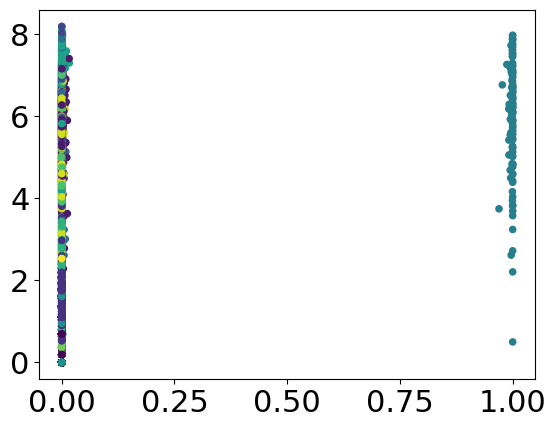

reply_count_mean - reply_count_std


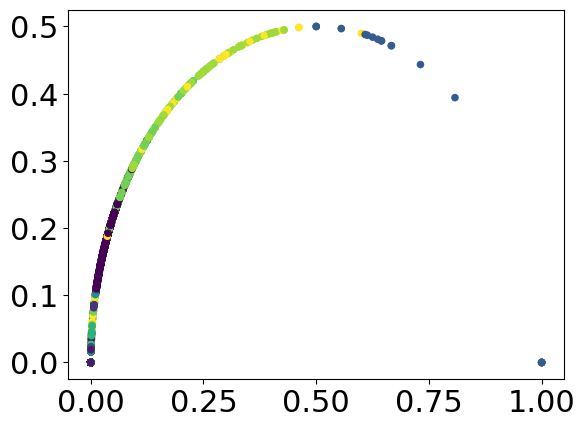

reply_count_mean - reply_count_entropy


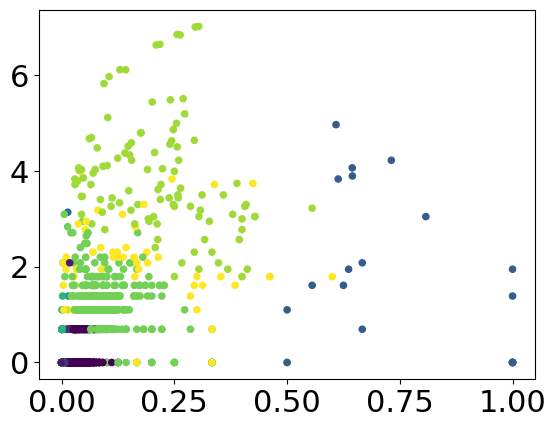

reply_count_mean - favorite_count_mean


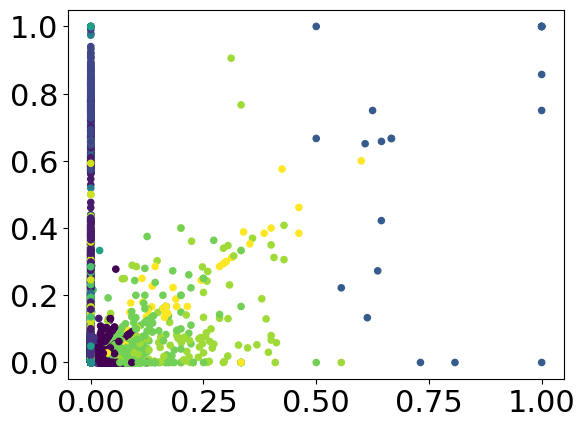

reply_count_mean - favorite_count_std


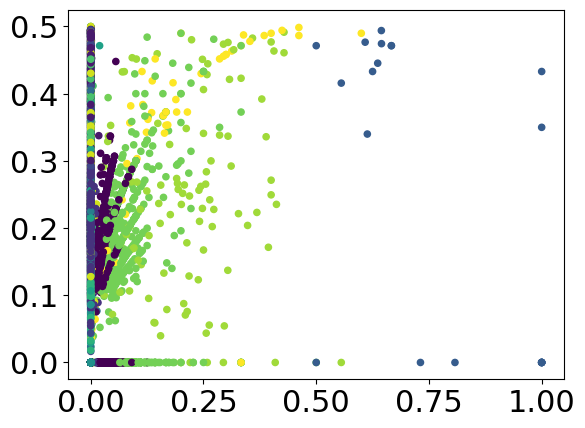

reply_count_mean - favorite_count_entropy


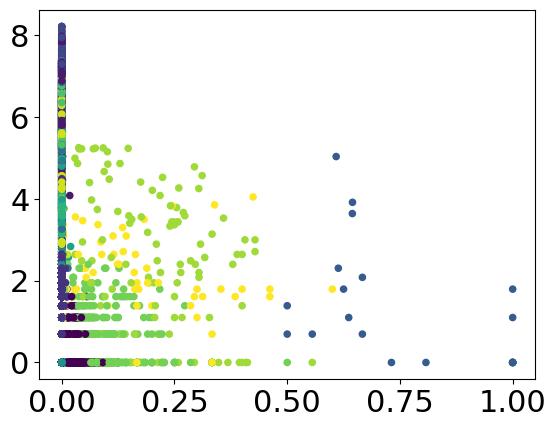

reply_count_mean - retweet_count_mean


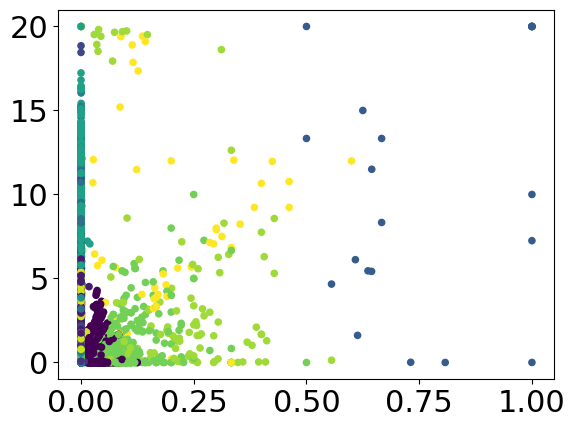

reply_count_mean - retweet_count_std


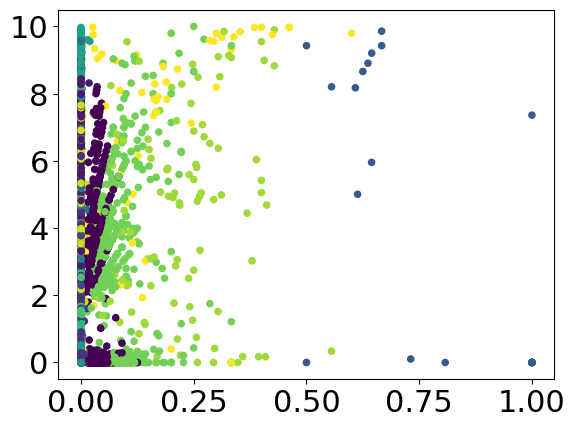

reply_count_mean - retweet_count_entropy


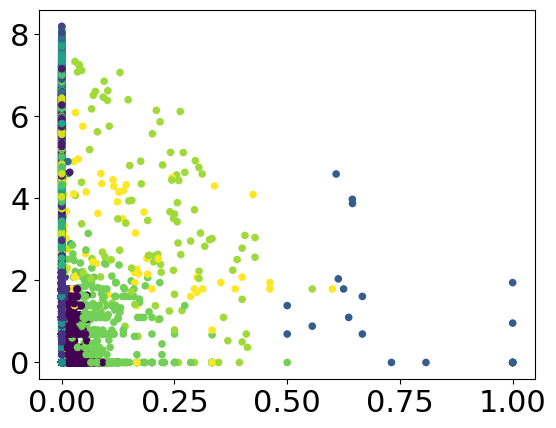

reply_count_std - reply_count_entropy


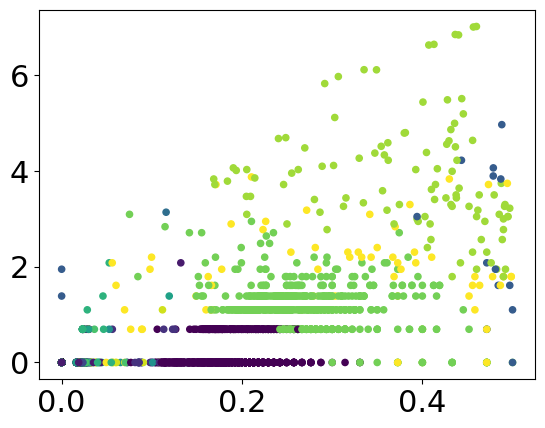

reply_count_std - favorite_count_mean


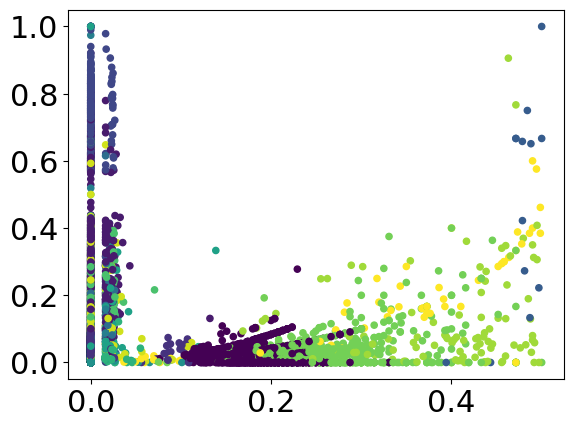

reply_count_std - favorite_count_std


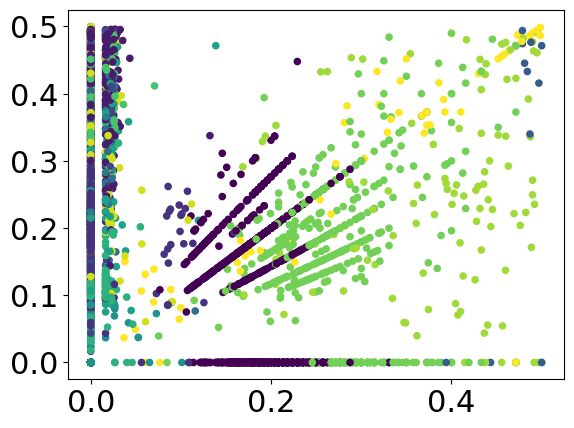

reply_count_std - favorite_count_entropy


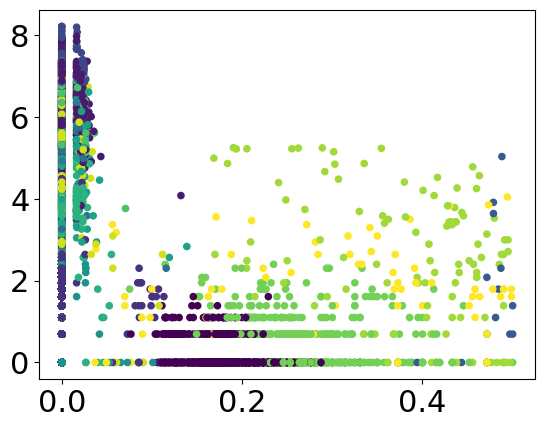

reply_count_std - retweet_count_mean


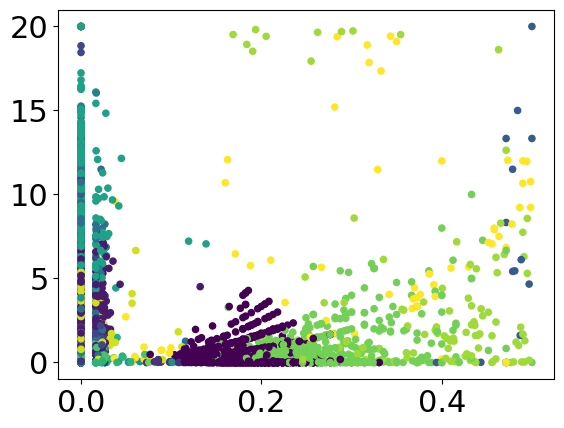

reply_count_std - retweet_count_std


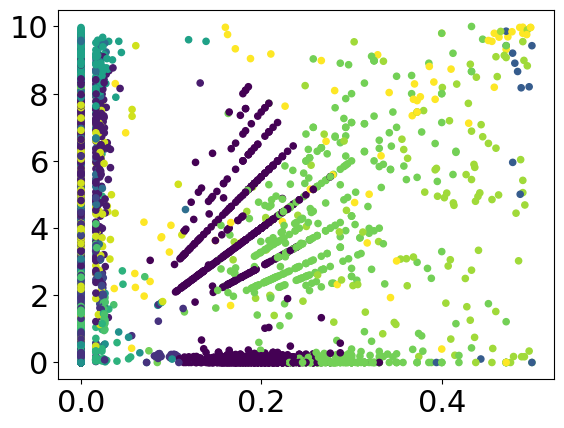

reply_count_std - retweet_count_entropy


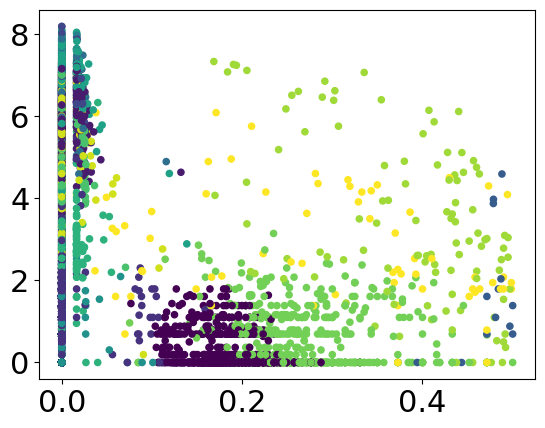

reply_count_entropy - favorite_count_mean


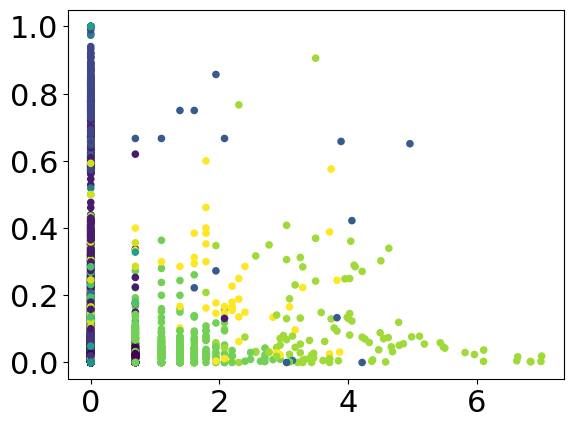

reply_count_entropy - favorite_count_std


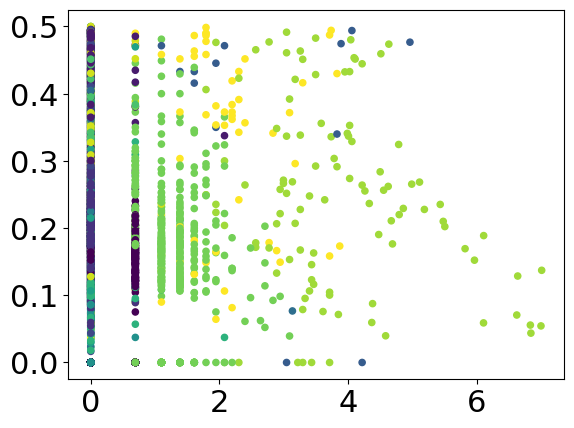

reply_count_entropy - favorite_count_entropy


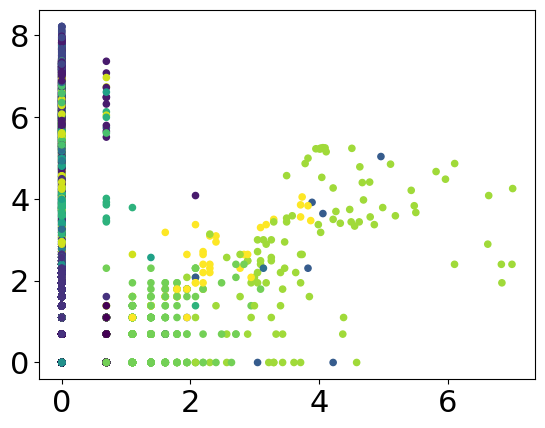

reply_count_entropy - retweet_count_mean


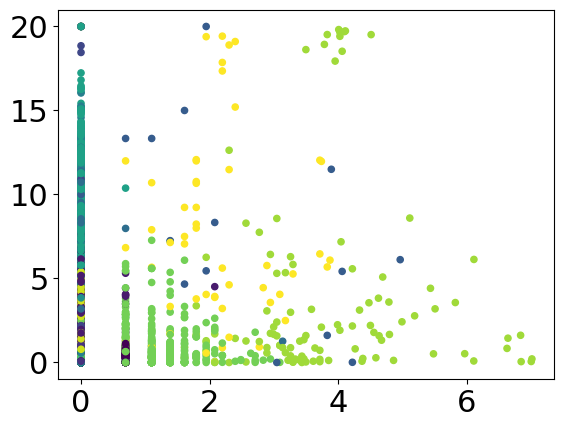

reply_count_entropy - retweet_count_std


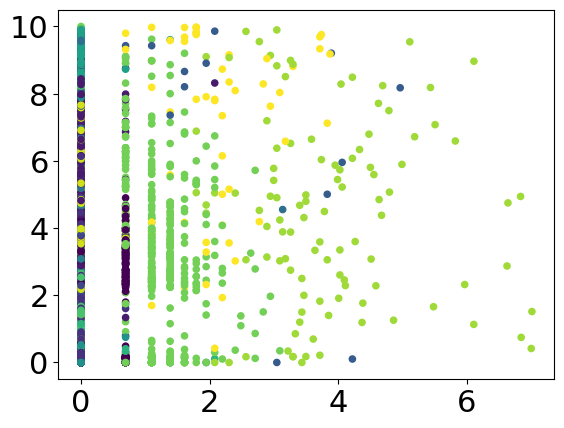

reply_count_entropy - retweet_count_entropy


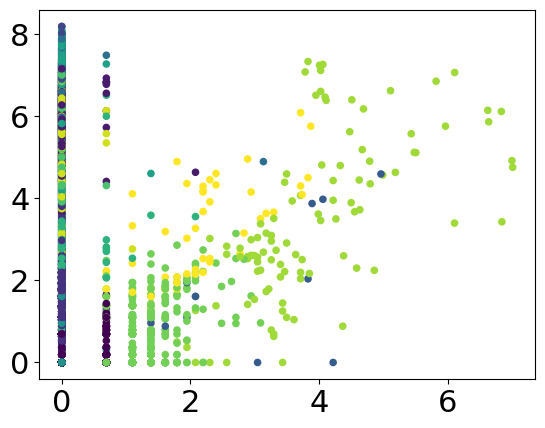

favorite_count_mean - favorite_count_std


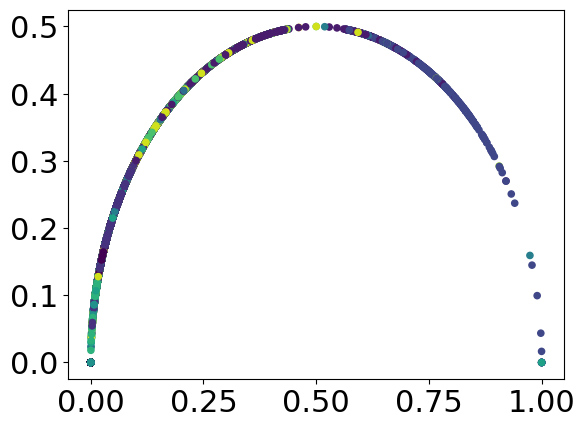

favorite_count_mean - favorite_count_entropy


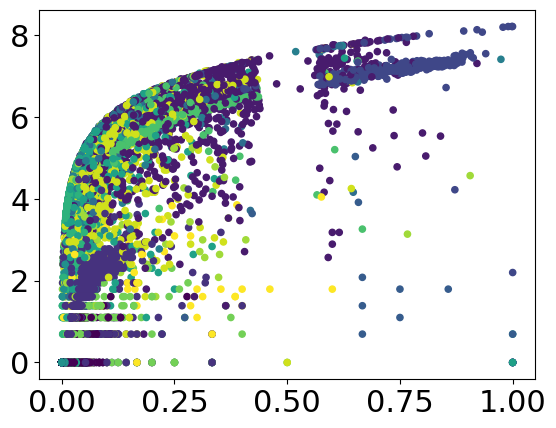

favorite_count_mean - retweet_count_mean


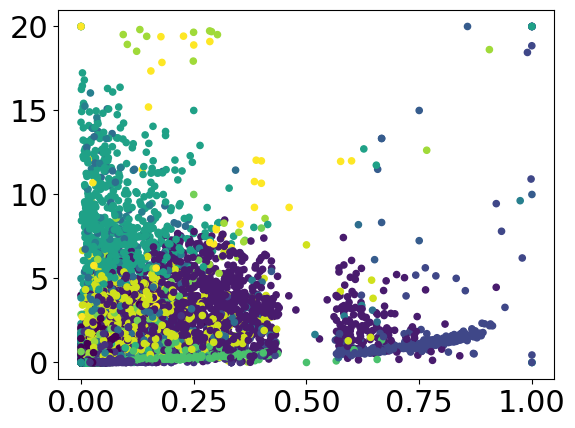

favorite_count_mean - retweet_count_std


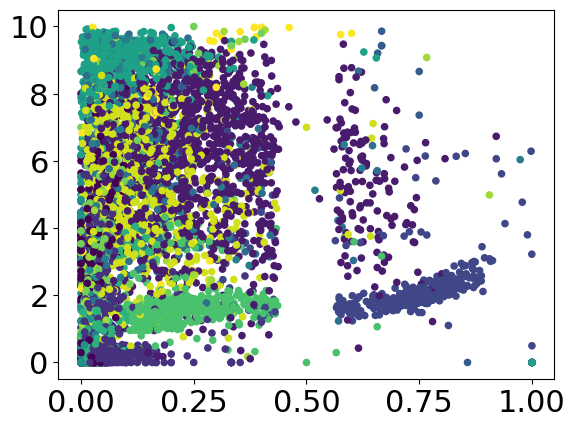

favorite_count_mean - retweet_count_entropy


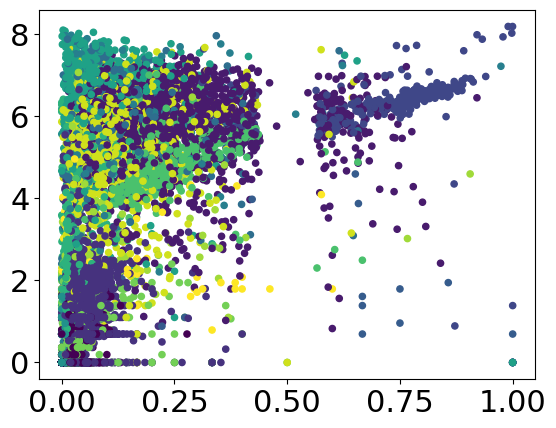

favorite_count_std - favorite_count_entropy


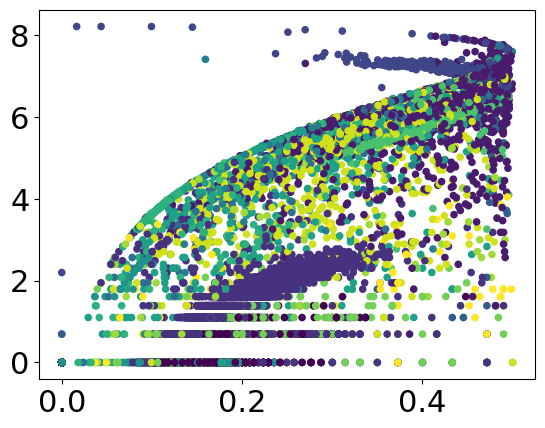

favorite_count_std - retweet_count_mean


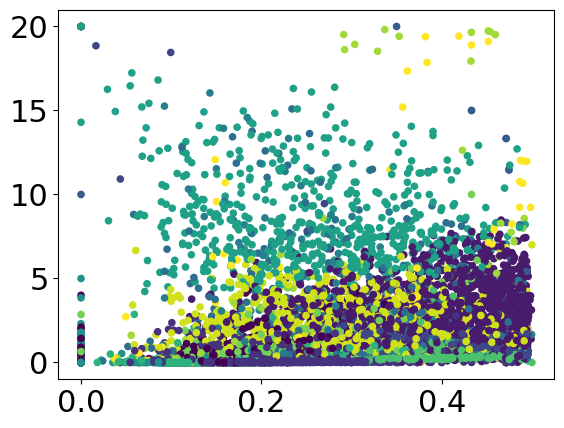

favorite_count_std - retweet_count_std


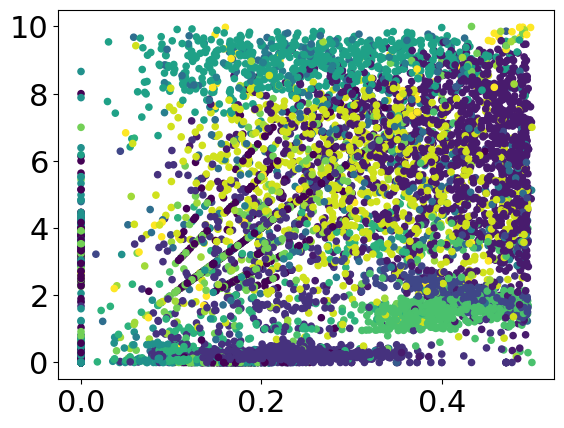

favorite_count_std - retweet_count_entropy


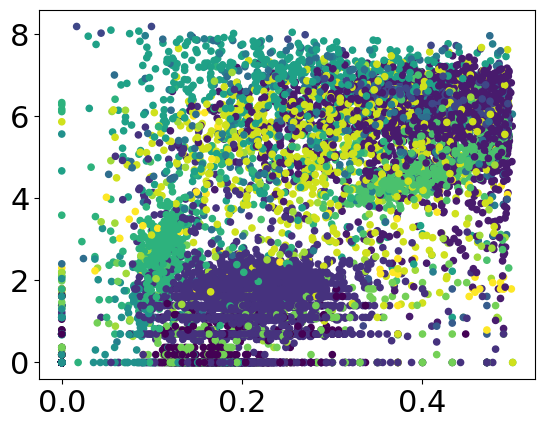

favorite_count_entropy - retweet_count_mean


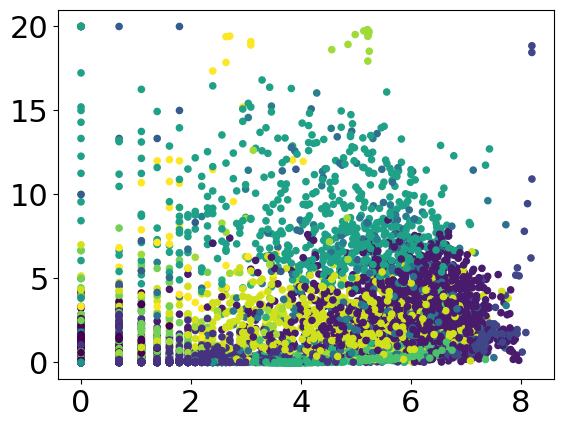

favorite_count_entropy - retweet_count_std


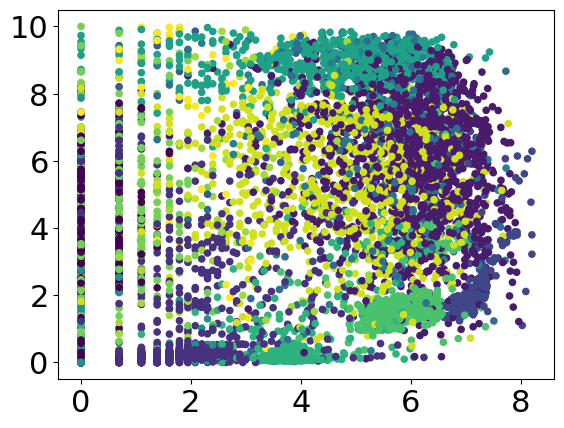

favorite_count_entropy - retweet_count_entropy


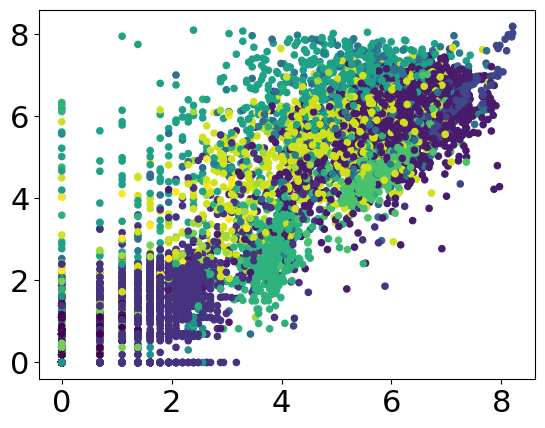

retweet_count_mean - retweet_count_std


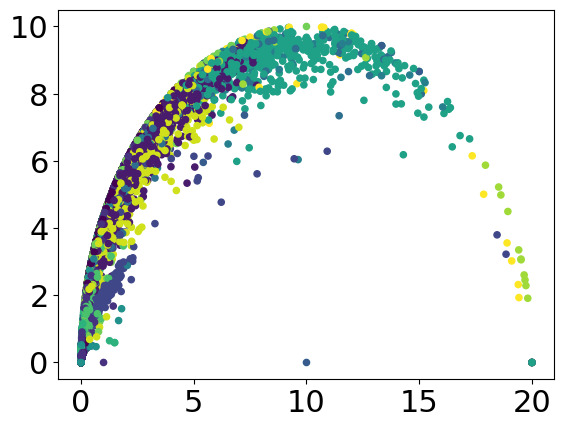

retweet_count_mean - retweet_count_entropy


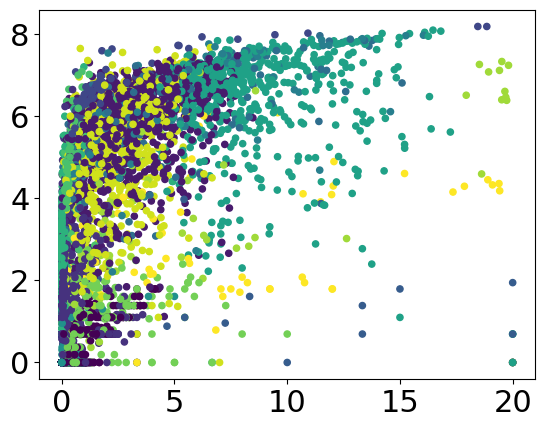

retweet_count_std - retweet_count_entropy


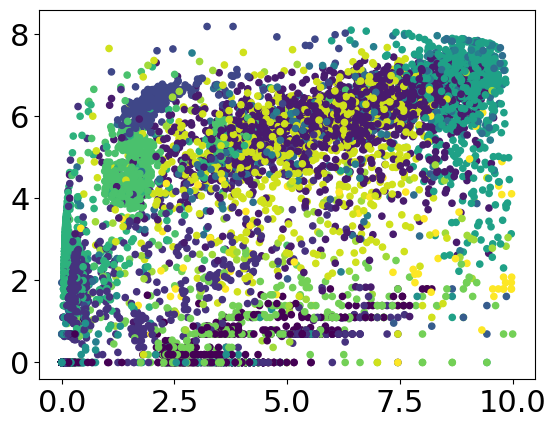

In [26]:
scatter_features_clusters(df_num, kmeans.labels_)

### PCA
Apply PCA to visualize the scatter plot distribution of the clustered data

In [27]:
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(X)

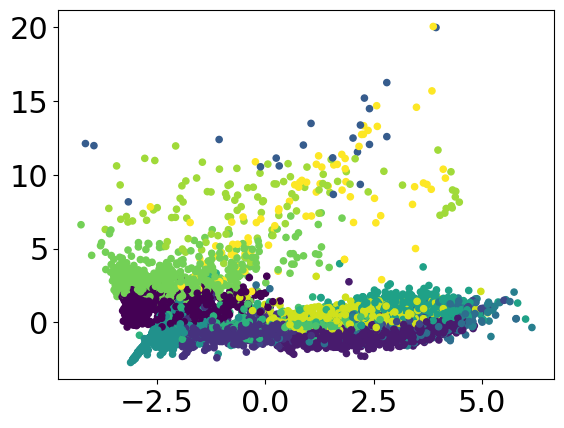

In [28]:
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=kmeans.labels_, s=20)
plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Evaluation KMeans

In [29]:
print('SSE %s' % kmeans.inertia_)
print('Silhouette %s' % silhouette_score(X, kmeans.labels_))
print('Separation %s' % metrics.davies_bouldin_score(X, kmeans.labels_))

SSE 39545.80801827996
Silhouette 0.37278037217090015
Separation 1.0986311633185273


## Additional Clustering Method : Self Organized Map Simple Clustering

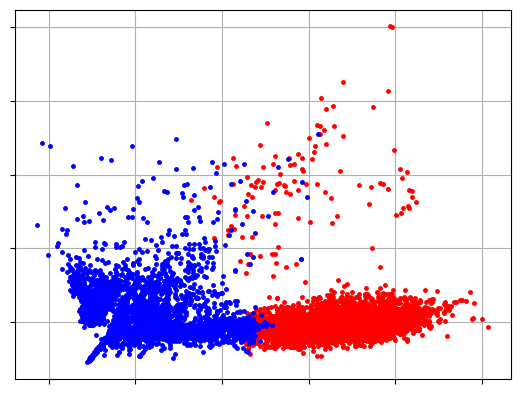

Figure(640x480)


In [30]:
from pyclustering.cluster import cluster_visualizer
from pyclustering.cluster.somsc import somsc
from pyclustering.samples.definitions import FCPS_SAMPLES
from pyclustering.utils import read_sample
  
# Create instance of SOM-SC algorithm to allocated two clusters
somsc_instance = somsc(X, 2, epouch=150)
 
# Run cluster analysis and obtain results
somsc_instance.process()
clusters = somsc_instance.get_clusters()
 
# Visualize clustering results.
visualizer = cluster_visualizer()
visualizer.append_clusters(clusters, X_reduced)
print(visualizer.show())

In [31]:
def som_get_centroids(clusters, X):
    som_clusters = list()
    for cluster in clusters:
        x_ = np.zeros(X.shape[1])
        for i in cluster:
            x_ += X[i]
        x_ /= len(cluster)
        
        som_clusters.append(x_)
    return np.array(som_clusters)

In [32]:
som_labels = np.array(somsc_instance.predict(X))

In [33]:
print('Silhouette %s' % silhouette_score(X, som_labels))
print('Separation %s' % metrics.davies_bouldin_score(X, som_labels))

Silhouette 0.3604489657553057
Separation 1.4502276689359606


In [44]:
separations = list()

for k in tqdm(range(2, 30)):
    # Create instance of SOM-SC algorithm to allocated two clusters
    somsc_instance = somsc(X, k, epouch=150)

    # Run cluster analysis and obtain results
    somsc_instance.process()
    
    som_labels = np.array(somsc_instance.predict(X))

    separations.append(metrics.davies_bouldin_score(X, som_labels))
    

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:17<00:00,  1.62it/s]


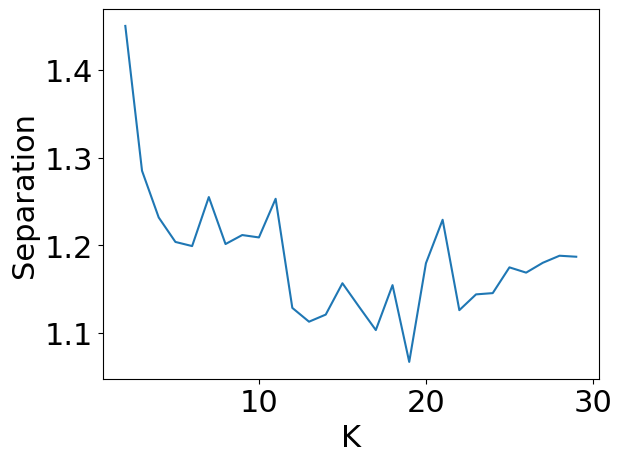

In [45]:
plt.plot(range(2, len(separations) + 2), separations)
plt.ylabel('Separation', fontsize=22)
plt.xlabel('K', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

In [46]:
selected_k=19

In [47]:
# Create instance of SOM-SC algorithm to allocated two clusters
somsc_instance = somsc(X, selected_k, epouch=150)
 
# Run cluster analysis and obtain results
somsc_instance.process()
clusters = somsc_instance.get_clusters()

som_clusters = som_get_centroids(clusters, X)
som_labels = np.array(somsc_instance.predict(X))

### Plot Cluster Results

In [48]:
som_centers = scaler.inverse_transform(som_clusters)

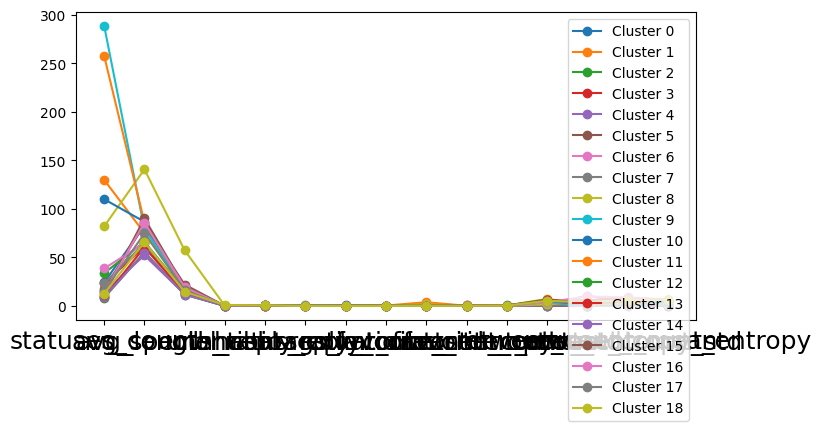

In [49]:
plot_parallel_coordinates_clusters(df_num, som_centers)

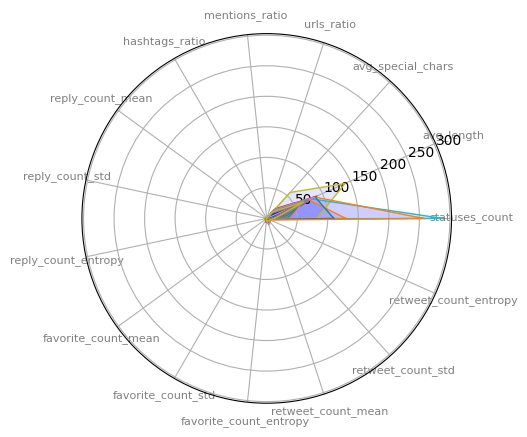

In [50]:
plot_radar_clusters(df_num, som_centers)

#### Distribution of CategoricalFeatures per Cluster

In [ ]:
categorical_hist_clusters(df_cat, som_labels, "lang")

In [ ]:
categorical_hist_clusters(df_cat, som_labels, "bot")

In [ ]:
plot_date_feature_clusters(df, kmeans.labels_, selected_k)

#### Distribution of Numerical Features per Cluster

In [ ]:
plot_numerical_features_clusters(df_num, som_labels, selected_k)

In [ ]:
scatter_features_clusters(df_num, som_labels)